In [2]:
import pylab as plt
import matplotlib.pyplot as plt
import numpy as np
import h5py
import shutil
import pdb
import datetime
import os
from operator import truediv
import operator
from scipy.optimize import curve_fit
import matplotlib.cm as cm
from scipy.optimize import leastsq

%pylab
%matplotlib inline
%load_ext autoreload
%autoreload 2



Using matplotlib backend: Qt4Agg
Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


In [3]:
corr_list = [4,11,17,22,27,28,29]
freq_phase = np.linspace(400,800,1024)
colors=['r','g','b','k','c','y','m']
legend_crosscorr = ["(0,4) A63","(1,4) A00","(2,4) A48","(3,4) A31","(5,4) B00","(6,4) B63","(7,4) B48"]

freq=462
num =14

In [4]:
def mag(tot_frames,corr_files):
        tot_magnitude = np.zeros((tot_frames, len(corr_list), len(freq_phase[50:990])))
        tot_magnitude_ref = np.zeros((tot_frames, 2, len(freq_phase[50:990])))
        x=0
        for corr_file in corr_files:
                for i in range(len(corr_list)):
                        frames =  corr_file['vis'][:].shape[0]
                        tot_magnitude[x:x+frames,i,:] = (np.sqrt(corr_file['vis'][:][:,corr_list[i],50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,corr_list[i],50:990]['real'].astype(np.float)**2))
                tot_magnitude_ref[x:x+frames,0,:] = np.sqrt(corr_file['vis'][:][:,26,50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,27,50:990]['real'].astype(np.float)**2)
                tot_magnitude_ref[x:x+frames,1,:] = corr_file['vis'][:][:,27,50:990]
                x = x + frames

        return tot_magnitude,tot_magnitude_ref

In [5]:
def gain_freq(corr_files,tot_frames,visibility, visibility_ref):
        x=0
        gain_1 = np.zeros((tot_frames, len(corr_list), len(freq_phase[50:990])))
        for corr_file in corr_files:
                frames = corr_file['vis'][:].shape[0]
                gain = np.zeros((frames, len(corr_list), len(freq_phase[50:990])))
                for i in range(len(corr_list)):
                        gain_1[x:frames+x,i,:] = 20*np.log10(np.sqrt(corr_file['vis'][:][:,corr_list[i],50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,corr_list[i],50:990]['real'].astype(np.float)**2)/(np.sqrt(corr_file['vis'][:][:,26,50:990]['imag'].astype(np.float)**2 + corr_file['vis'][:][:,26,50:990]['real'].astype(np.float)**2)))
                x=frames+x

        return gain_1[:,:,::-1]

In [6]:
def delay_unwrap(tot_frames,corr_files):
        delay = np.zeros((tot_frames,len(corr_list)))
        #phi = np.zeros((frames, len(corr_list), len(freq_phase[20:990])))# not taking some frequency bins
        kk=0
        delay_freq_bad_frame = np.zeros((len(corr_list),len(freq_phase[50:990])))
        for corr_file in corr_files:
                vis = corr_file['vis'][:][:,corr_list,50:990]
                frames = corr_file['vis'][:].shape[0]
                vis_abs =  np.sqrt((vis['imag']).astype(np.float)**2+(vis['real']).astype(np.float)**2)
                #vis_abs =  np.sqrt((vis['imag']).astype(np.float)**2+(vis['real']).astype(np.float)**2)
                phi = np.arctan2((vis['imag']),(vis['real']))
                unwrap_phase_1 = np.unwrap(phi)
                unwrap_phase = unwrap_phase_1[:,::-1]/(2*np.pi)
                slope = [[0 for x in range(len(corr_list))] for y in range(frames)]
                for j in range(len(corr_list)):
                        slope_1 = []
                        for i in range(frames):
                                slope[i],b = np.polyfit(freq_phase[50:990]*10**6,unwrap_phase[i][j][:],1)
                                if slope[i]<0:
                                        slope[i] = slope[i]*(-1.0)
                        delay[kk:kk+frames,j] = slope
                kk=kk+frames
                #pdb.set_trace()
        return np.array(delay),unwrap_phase #

In [7]:
def get_timestamp(tot_frames,corr_files):
        cpu_cycle = np.zeros(tot_frames)
        x = 0
        for corr_file in corr_files:
                frame = corr_file['vis'][:].shape[0]
                timestamp = corr_file['timestamp']
                cpu_cycle[x:x+frame] = [time[1] for time in timestamp]
                x=x+frame
        return cpu_cycle


In [8]:
def data(chan):
        number_of_frame = corr_file['vis'][:].shape[0]
        print('Number of frames:' + str(number_of_frame))
        return number_of_frame

In [9]:
para=3
def quadratic(x,*p):
        freq_reqd = freq
        return p[0]*x**2 + p[1]*x+  p[2]

In [10]:
def sinusoidal(x,*p):
        freq_reqd = freq
        return p[0]*x + p[1]*(np.cos(2*np.pi*p[2]))#+ np.cos(2*np.pi*4/(0.84*3*10**2/freq_reqd)))

In [11]:
source_dir = ['C:/Users/sidhant/Desktop/data/20170407T194716Z_stone_corr/', 'C:/Users/sidhant/Desktop/data/20170410T180753Z_stone_corr/','C:/Users/sidhant/Desktop/data/20170414T020912Z_stone_corr/' ,'C:/Users/sidhant/Desktop/data/20170430T010748Z_stone_corr_one_file_deleted/', 'C:/Users/sidhant/Desktop/data/20170519T221539Z_stone_corr/' ,'C:/Users/sidhant/Desktop/data/20170525T174006Z_stone_corr_two_files_delated/'] #Apr 7-apr 10, #Apr 10-APR 13 #Apr 29 - May14
tot_frames = 0
corr_files=[]
for d in range(len(source_dir)):
    source_directory = source_dir[d]
    source_name = os.path.realpath(source_directory).split('/')[-1]
    active_dir = source_dir[d]
    all_file_names = os.listdir(active_dir)
    data_file_names = []
    for file_name in all_file_names:
        if ('.lock' not in file_name) and ('.h5' in file_name):
                data_file_names.append(file_name)
    data_file_names.sort()
    for file_name in data_file_names:
        corr_files.append(h5py.File(active_dir+file_name,'r'))

for corr_file in corr_files:
    frames = data(corr_list)
    tot_frames = tot_frames + frames
    

print(corr_files)
visibility, visibility_ref = mag(tot_frames,corr_files)
delay, unwrap_phase = delay_unwrap(tot_frames,corr_files)
# the return gain is in db/logrithmic
gain_all_db = gain_freq(corr_files,tot_frames,visibility, visibility_ref)
gain_all = 10**(gain_all_db/20)

time_stamp = get_timestamp(tot_frames,corr_files)
#date_stamp = [datetime.datetime.fromtimestamp(time) + datetime.timedelta(hours = -7) for time in time_stamp]
date_stamp = [datetime.datetime.fromtimestamp(time)  for time in time_stamp]

Number of frames:360
Number of frames:61
Number of frames:360
Number of frames:119
Number of frames:360
Number of frames:360
Number of frames:360
Number of frames:264
Number of frames:360
Number of frames:360
Number of frames:54
Number of frames:360
[<HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00216004_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00216003_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00648000_0000.h5" (mode r)>, <HDF5 file "00863999_0000.h5" (mode r)>, <HDF5 file "00000000_0000.h5" (mode r)>, <HDF5 file "00216003_0000.h5" (mode r)>, <HDF5 file "00432001_0000.h5" (mode r)>, <HDF5 file "00216003_0000.h5" (mode r)>]


In [12]:
print(len(date_stamp))

3378


In [13]:
file = open("temp_data_all.out","r")
date_temp = np.loadtxt('temp_data_all.out')
file.close()

date_weather_data_new = date_temp[0]
temp_weather_data_new = date_temp[1]

temp_frame = [718,120,718,236,718,718,718,526,50,718,106,718]

a= date_weather_data_new[0:718]
b= temp_weather_data_new[0:718]
temp_1 = np.append(a[::2],a[717])
time_1 = np.append(b[::2],b[717])

a= date_weather_data_new[718:838]
b= temp_weather_data_new[718:838]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[119])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[119])

a= date_weather_data_new[838:1556]
b= temp_weather_data_new[838:1556]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[1556:1792]
b= temp_weather_data_new[1556:1792]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[235])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[235])

a= date_weather_data_new[1792:2510]
b= temp_weather_data_new[1792:2510]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[2510:3228]
b= temp_weather_data_new[2510:3228]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[3228:3946]
b= temp_weather_data_new[3228:3946]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[717])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[717])

a= date_weather_data_new[3946:4472]
print(len(a))
b= temp_weather_data_new[3946:4472]
temp_1 = np.append(temp_1,a[::2])
temp_1 = np.append(temp_1,a[525])
time_1 = np.append(time_1,b[::2])
time_1 = np.append(time_1,b[525])

time_partial_new = np.array([(datetime.datetime.fromtimestamp(x))  for x in temp_1 ])
#time_partial_new = np.array([(datetime.datetime.fromtimestamp(x)) for x in temp_1 ])

# these are the times that we are using from here!
temp_intercept_model = time_1[42::]
time_intercept_model = time_partial_new[42::]

526


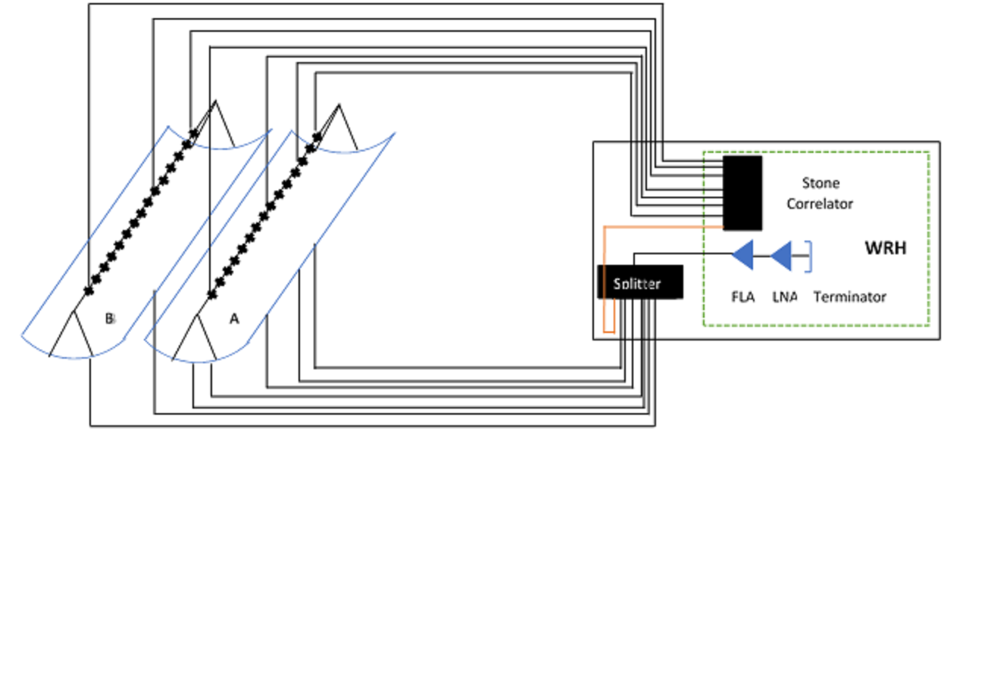

In [14]:
from IPython.display import Image
Image(filename='experimental_setup.png')

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\ipykernel\__main__.py:28: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


only one
only one
only one
only one
only one
only one
only one
579.472140762
478.201368524


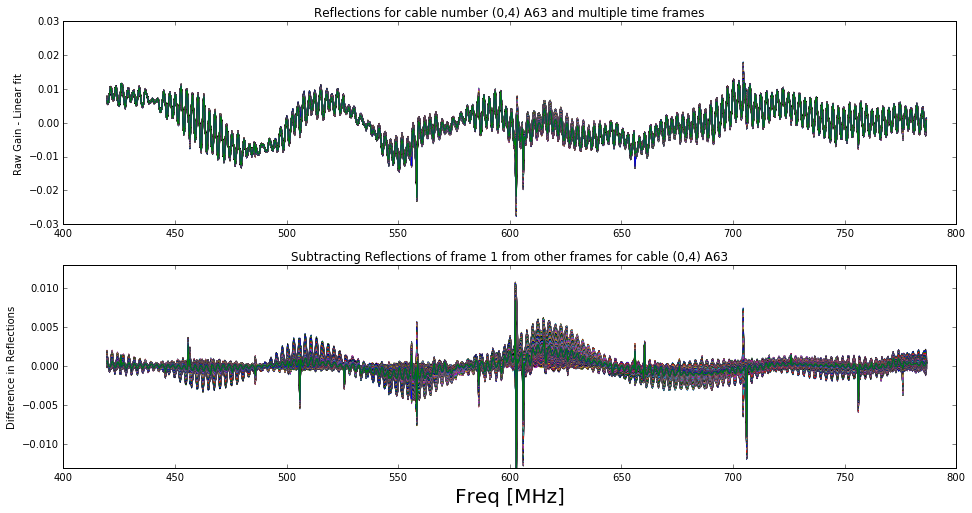

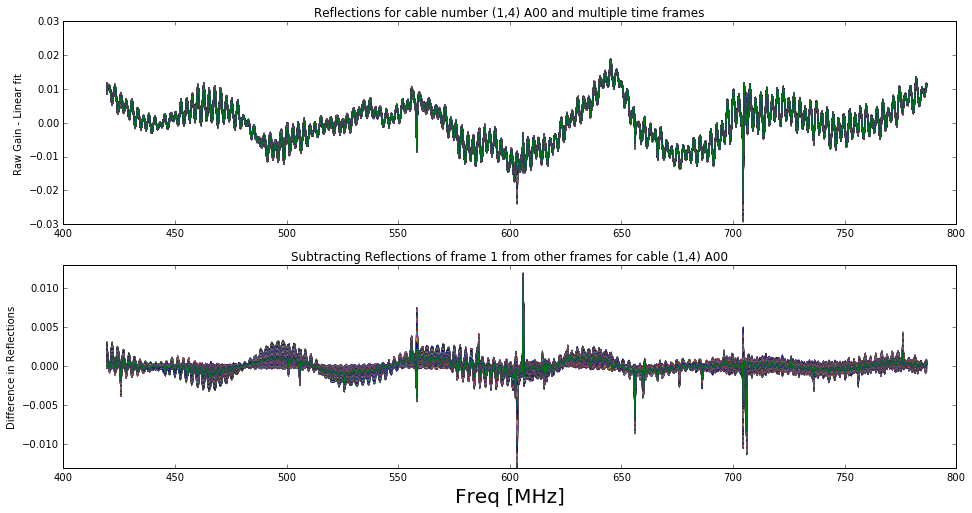

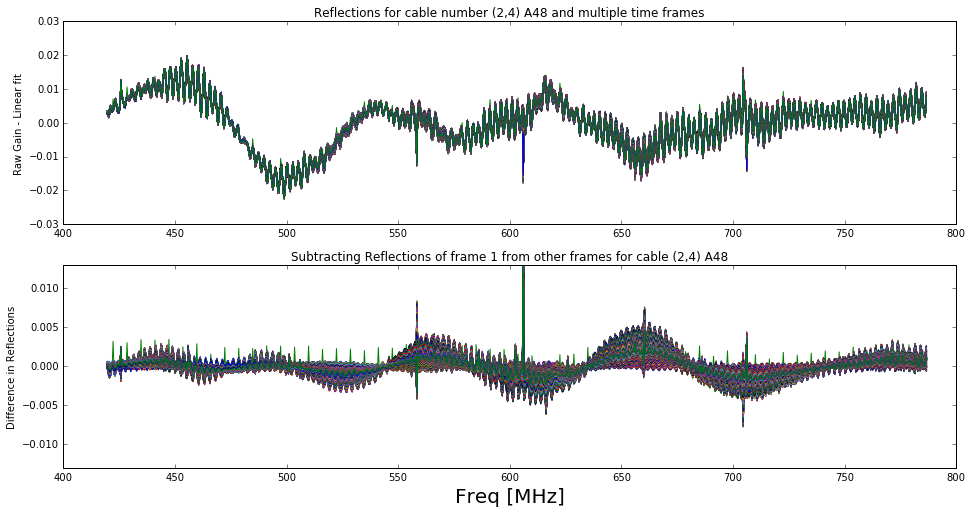

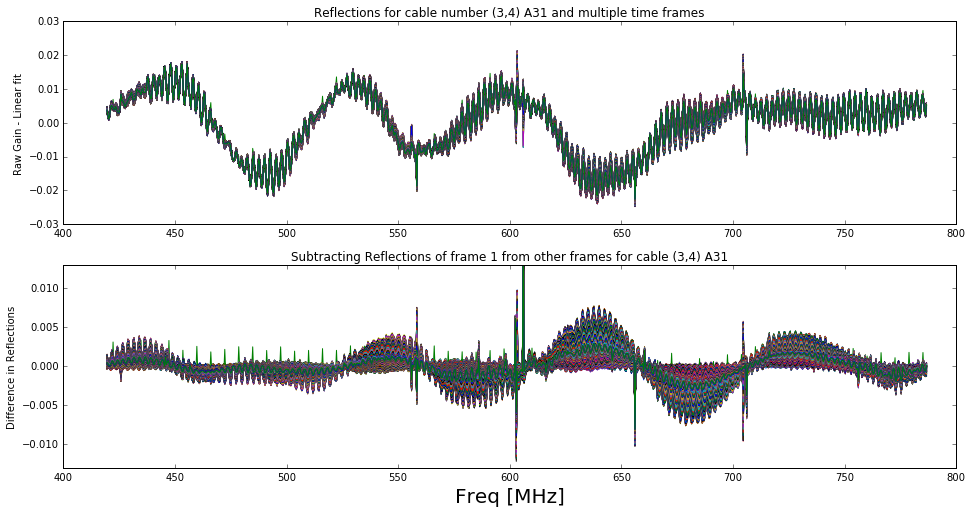

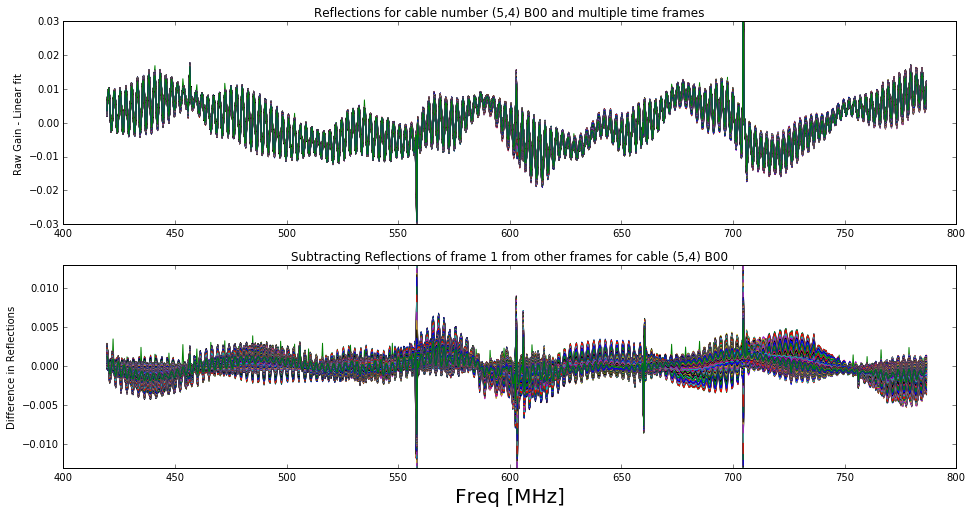

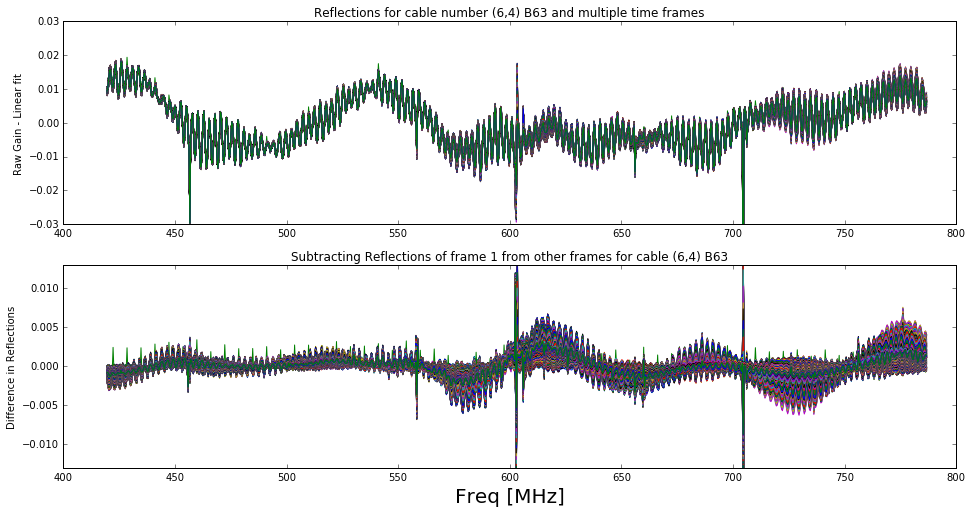

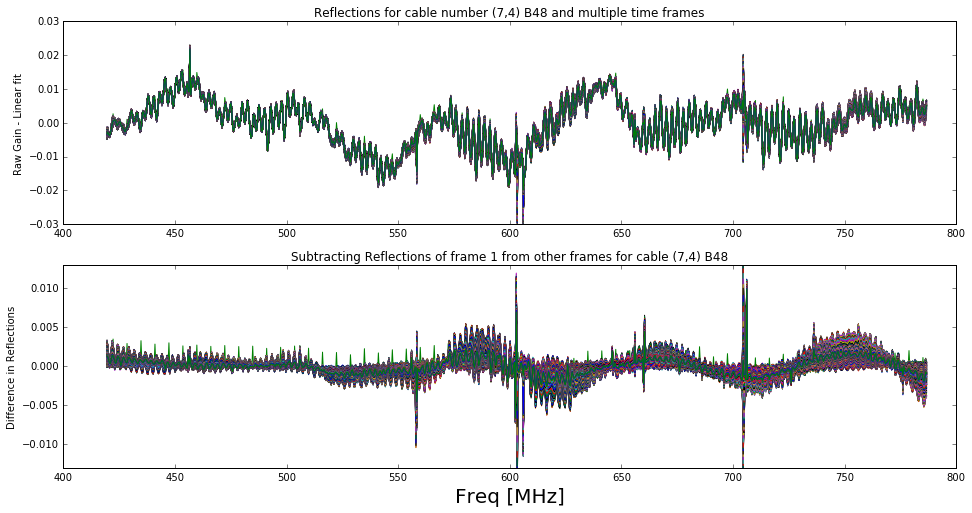

In [15]:
# Analyzing one cable and multiple time frames 

k=0
figure(figsize(16,8))
frame_numbers = np.linspace(0,800, num=800)

val_single_freq_bin1 = np.zeros(len(frame_numbers))
val_single_freq_bin2 = np.zeros(len(frame_numbers))
val_single_freq_bin3 = np.zeros(len(frame_numbers))
val_single_freq_bin4 = np.zeros(len(frame_numbers))

val_all_freq = []
val_all_freq_pre = np.zeros((len(frame_numbers),len(freq_phase[50:990])))
count=0
calc_avg = []

for i in range(len(corr_list)):
    val_all_freq.append([])

plt_count=0        
for kk in range(len(corr_list)):
    
    val_all_freq[kk] = np.zeros((len(frame_numbers),len(freq_phase[50:990])))
    plt_count = plt_count+1
      
    for i in range(len(frame_numbers)):
        
        gain_raw = gain_all[frame_numbers[i],kk,:] # for cable 2
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_line_sub = gain_raw - p(freq_phase[50:990])

        if i==0:
            print('only one')
            gain_line_sub_reference = gain_line_sub
            gain_reference = gain_raw
        
        plt.figure(plt_count)
        plt.subplot(2,1,1)
        plt.plot(freq_phase[50:990], gain_line_sub )
        plt.ylim(-0.03,0.03)
        plt.title('Reflections for cable number %s and multiple time frames' %(str(legend_crosscorr[kk])))
        plt.ylabel('Raw Gain - Linear fit')
        #plt.xlabel('Freq [MHz]', size=20)

        #plt.figure(plt_count+2)
        plt.subplot(2,1,2)
        plt.plot(freq_phase[50:990],gain_line_sub- gain_line_sub_reference)
        plt.ylim(-0.013,0.013)
        plt.title('Subtracting Reflections of frame 1 from other frames for cable %s' %(str(legend_crosscorr[kk])),)
        plt.ylabel('Difference in Reflections')
        plt.xlabel('Freq [MHz]', size=20)

        for k in range(len(freq_phase[50:990])):
            val_all_freq[kk][i][k] = gain_line_sub[k]- gain_line_sub_reference[k]
            val_all_freq_pre[i,k] = gain_line_sub[k]

        val_single_freq_bin1[i] = gain_line_sub[459]- gain_line_sub_reference[459]
        val_single_freq_bin2[i] = gain_line_sub[460]- gain_line_sub_reference[460]
        val_single_freq_bin3[i] = gain_line_sub[461]- gain_line_sub_reference[461]
        val_single_freq_bin4[i] = gain_line_sub[700]- gain_line_sub_reference[700]

    plt.savefig('times-800-reflection %s .png' %(legend_crosscorr[kk]))
print(freq_phase[459])
print(freq_phase[200])
    

0
1
2
3
4
5
6


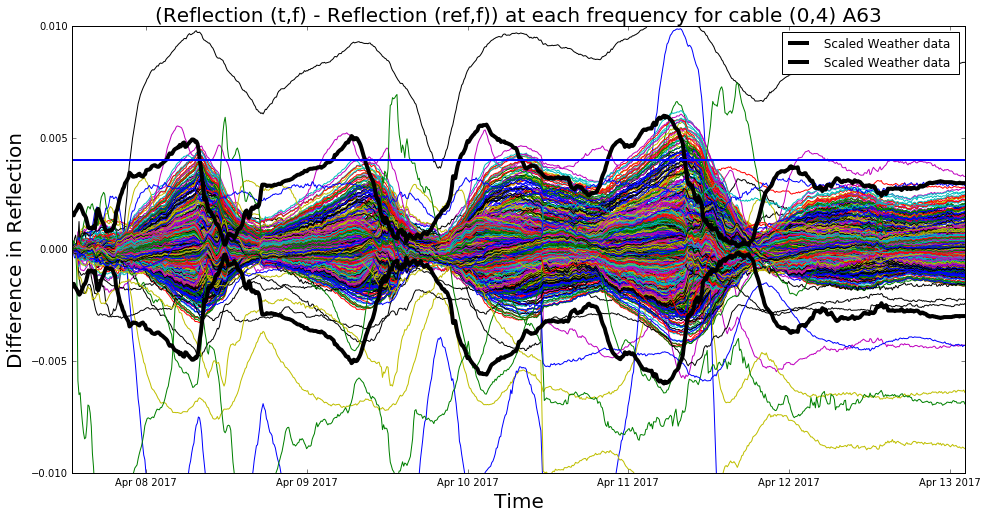

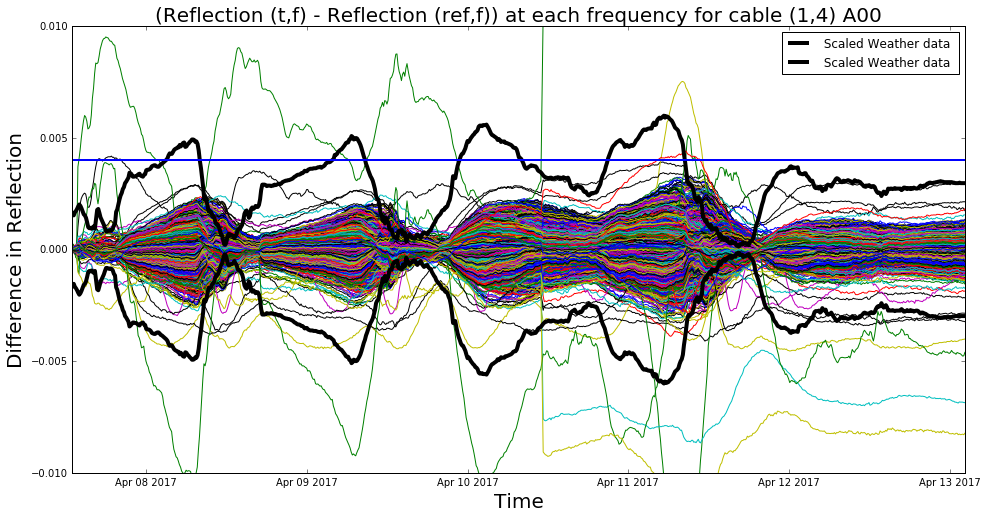

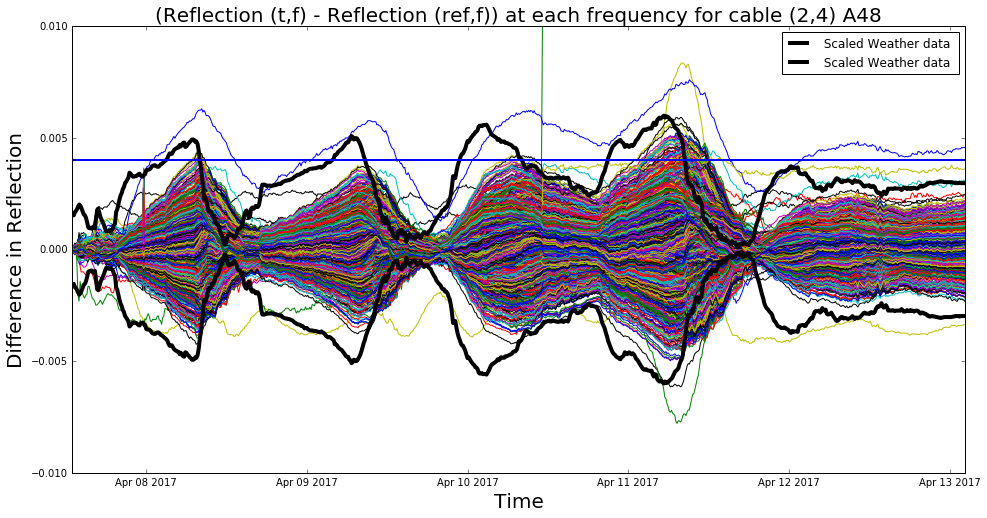

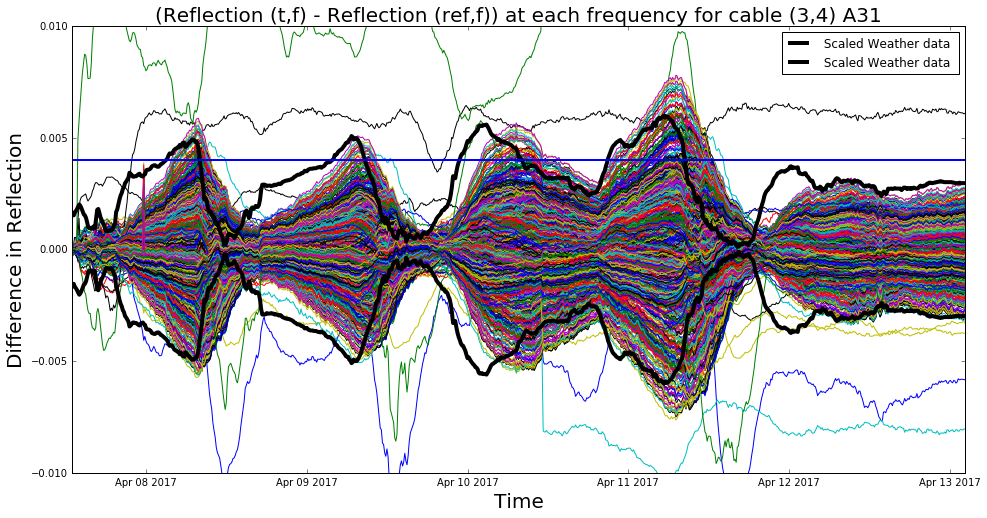

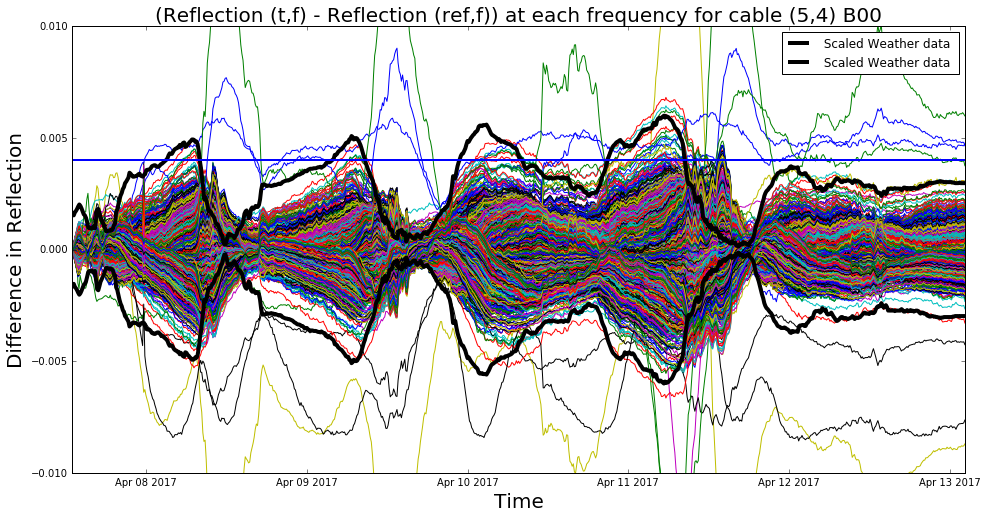

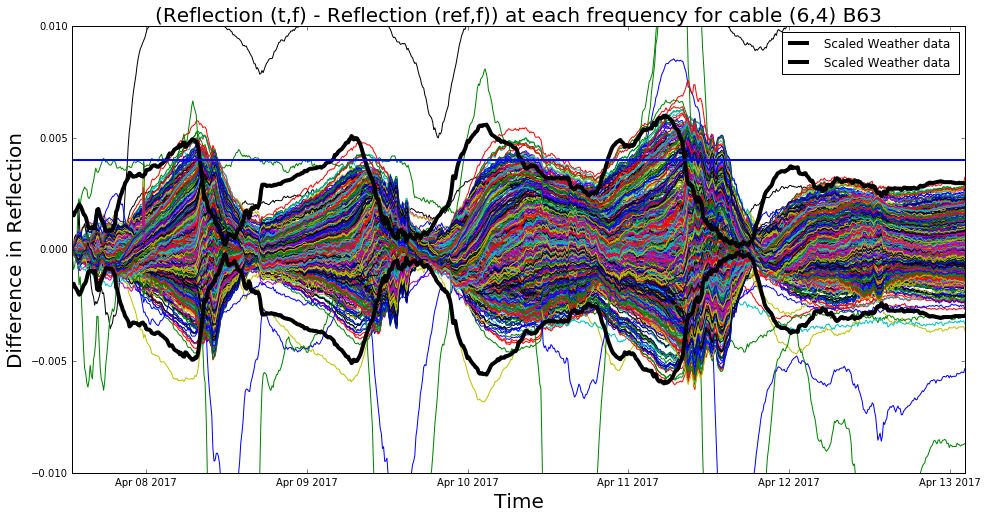

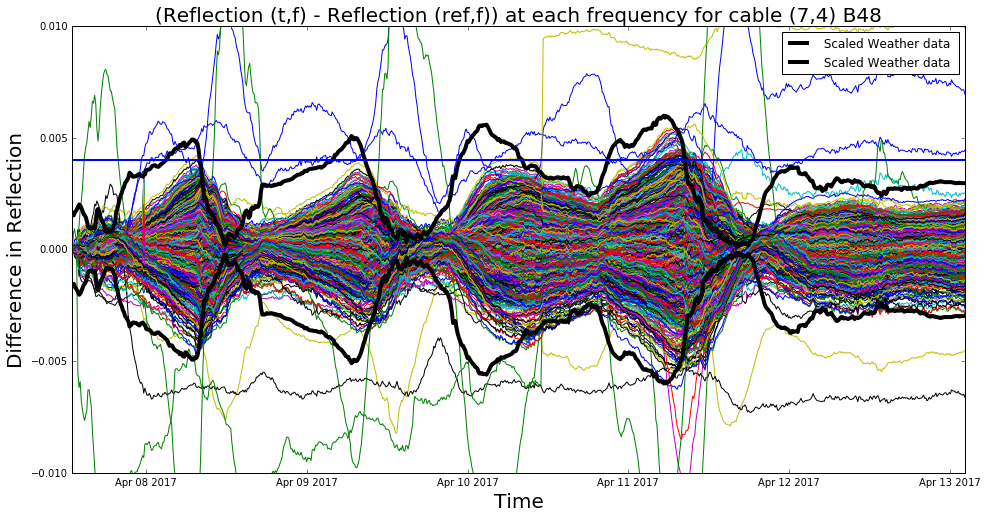

In [16]:
for kk in range(len(corr_list)):
    print(kk)
    for k in range(len(freq_phase[50:990])):
        plt.figure(kk+1)
        plt.plot(date_stamp[0:800],val_all_freq[kk][:,k])
    plt.ylim(-0.01,0.01)
    plt.plot(time_intercept_model[0:800],2*((temp_intercept_model[0:800]+273)/5000 -0.057), 'k',linewidth =4,label= ' Scaled Weather data ')   
    plt.plot(time_intercept_model[0:800],-2*((temp_intercept_model[0:800]+273)/5000 -0.057), 'k',linewidth =4,label= ' Scaled Weather data ')
    plt.title('(Reflection (t,f) - Reflection (ref,f)) at each frequency for cable %s' %(legend_crosscorr[kk]), size =20)
    plt.ylabel('Difference in Reflection', size =20)
    plt.xlabel('Time', size=20)
    plt.axhline(y=0.004,linewidth=2)
    plt.legend()
    #plt.savefig('diff_reflection %s.png' %(legend_crosscorr[kk]))

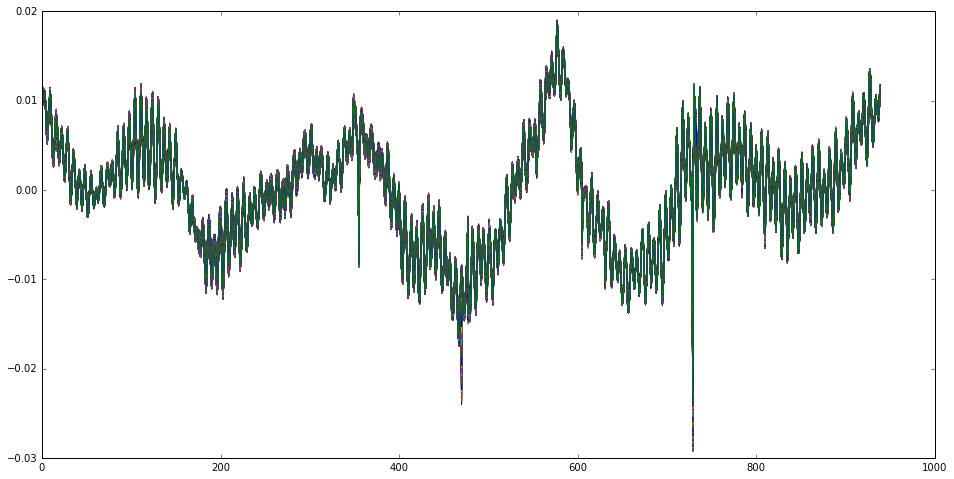

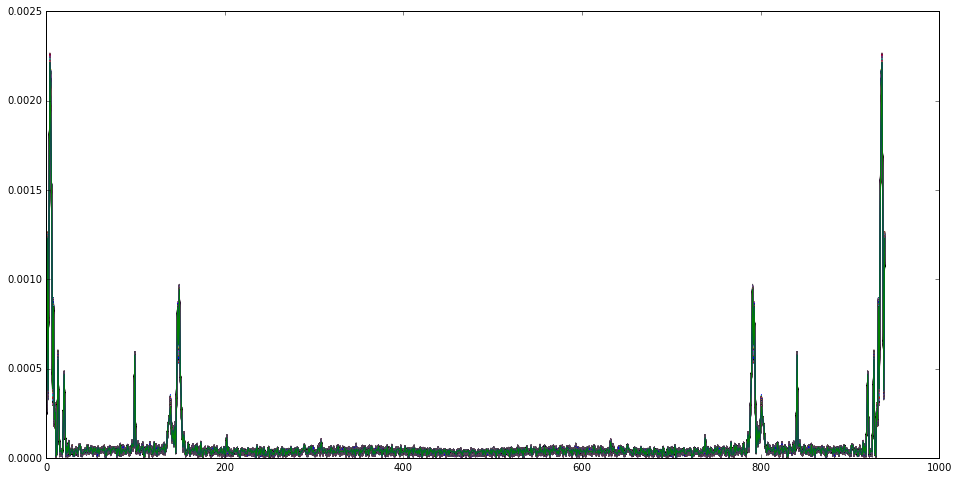

In [17]:
plt.figure(figsize(16,8))

for k in range(800):

    z=np.polyfit(freq_phase[50:990], gain_all[k,1,:],1)
    p=np.poly1d(z)
    gain_line_sub = gain_all[k,1,:] - p(freq_phase[50:990])
    #gain_all_line_sub.append(gain_line_sub)
    ifft_component = np.fft.ifft(gain_line_sub)  
    
    plt.figure(1)
    plt.plot(gain_line_sub)
    
    plt.figure(2)
    plt.plot(np.abs(ifft_component))
    '''
    plt.xlim(120,165)
    plt.ylim(0,0.001)
    plt.axvline(x=139)
    plt.axvline(x=147)
    plt.axvline(x=149)
    
    plt.xlim(780,850)
    plt.ylim(0,0.001)
    plt.axvline(x=940-139)
    plt.axvline(x=940-147)
    plt.axvline(x=940-149)
    # plt.xlime(120.150, lineshape = 3)
    '''

940
1880


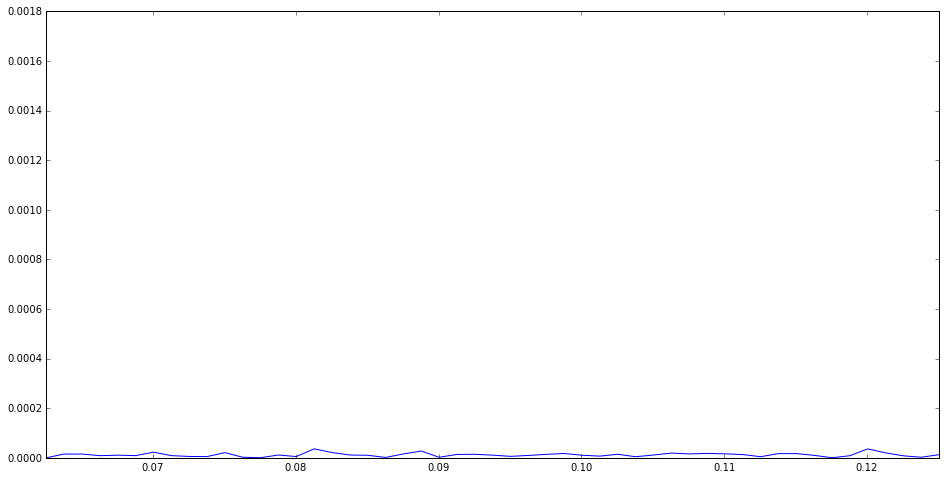

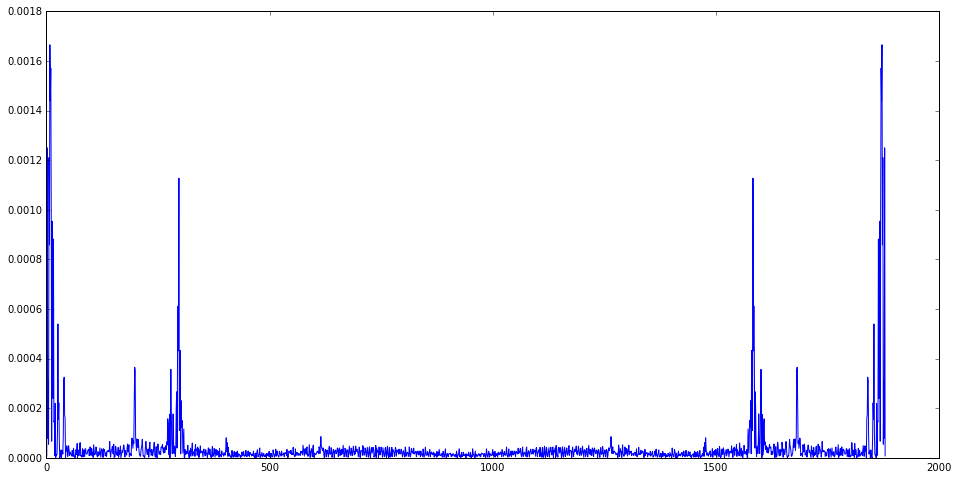

In [18]:
plt.figure(figsize(16,8))
k=1
z=np.polyfit(freq_phase[50:990], gain_all[k,1,:],1)
p=np.poly1d(z)
gain_line_sub1 = gain_all[k,1,:] - p(freq_phase[50:990])
gain_line_sub = np.concatenate((gain_line_sub1,gain_line_sub1[::-1]))

ifft_component = np.fft.ifft(gain_line_sub)  

time=np.linspace(0,2.56, num=2048)

print(len(time[50:990]))
print(len(ifft_component))
#plt.figure(1)
#plt.plot(time,gain_line_sub)

plt.figure(1)
plt.plot(time[50:990],np.abs(ifft_component)[940:len(ifft_component)])
plt.xlim(time[50],time[100])

plt.figure(2)
plt.plot(np.abs(ifft_component))

In [20]:
def my_sin(term2,amp,phase,n):
    return amp*np.sin(n*term2 + phase)

In [21]:
figure(figsize(16,8))

reflections_generate_all_cable=[]
reflections_generate_one_cable = np.zeros(len(gain_all[0,1,:]))


for k in range(len(corr_list)):
    
    z=np.polyfit(freq_phase[50:990], gain_all[0,k,:],1)
    p=np.poly1d(z)
    gain_line_sub = gain_all[0,k,:] - p(freq_phase[50:990])
    
    
    reflections_generate_one_cable = np.zeros(len(gain_all[0,1,:]))
    #print(np.int(len(parameters_all_cables[k][i])))
    for i in range(np.int(len(parameters_all_cables[k]))):
        reflections_generate_one_cable = reflections_generate_one_cable + my_sin(term2, *parameters_all_cables[k][i][:])
    
    reflections_generate_all_cable.append(reflections_generate_one_cable)
    plt.figure(1)
    plt.plot(freq_phase[50:990],reflections_generate_one_cable, color=colors[k], label = legend_crosscorr[k])
    plt.title('')
    plt.xlabel('Frequency [MHz]', size=20)
    plt.legend()
    
    plt.figure(2)
    plt.plot(gain_line_sub-reflections_generate_one_cable, color=colors[k])
    #plt.ylim(-0.005,0.005)

NameError: name 'parameters_all_cables' is not defined

# Reflections due to short cables only

0


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\ipykernel\__main__.py:44: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


1
2
3
4
5
6


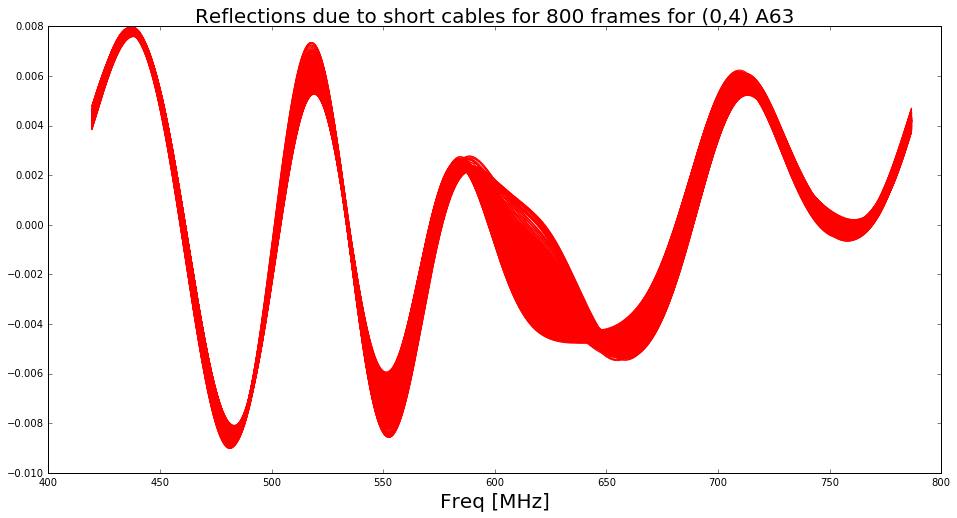

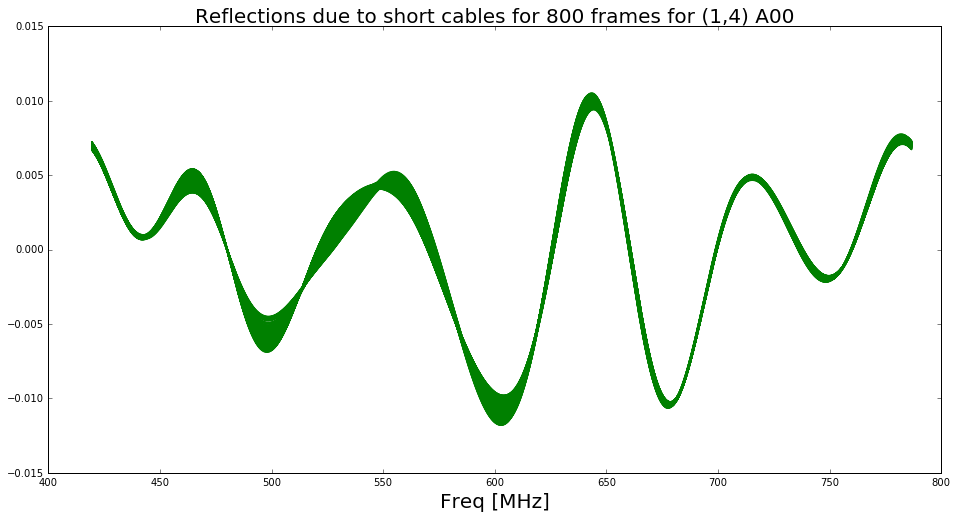

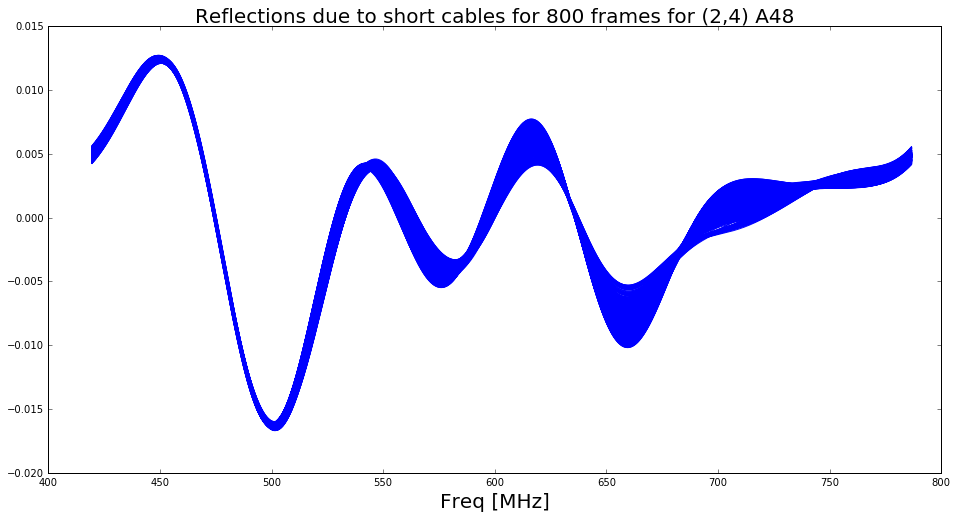

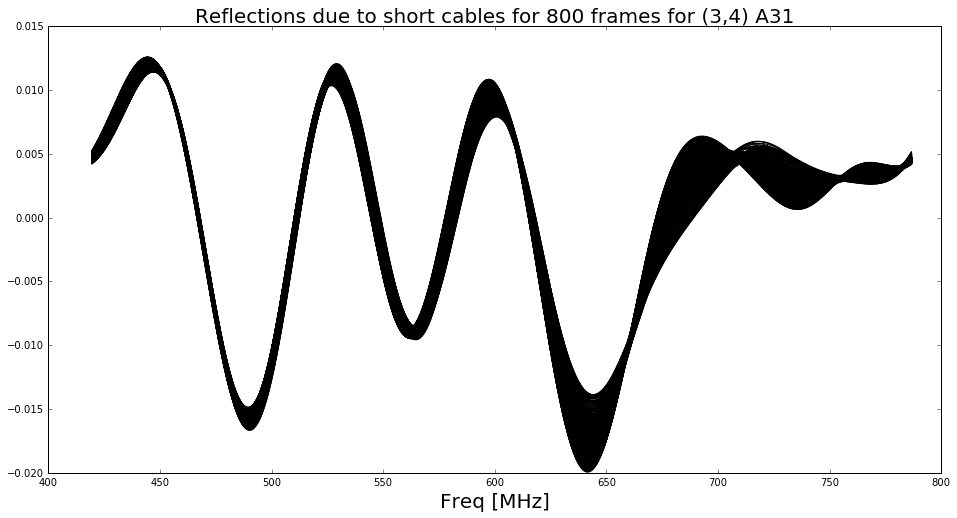

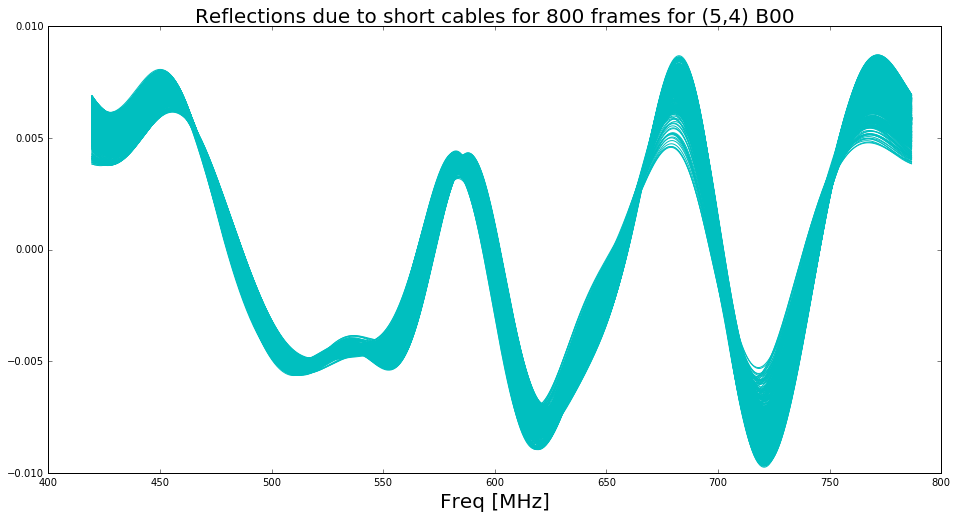

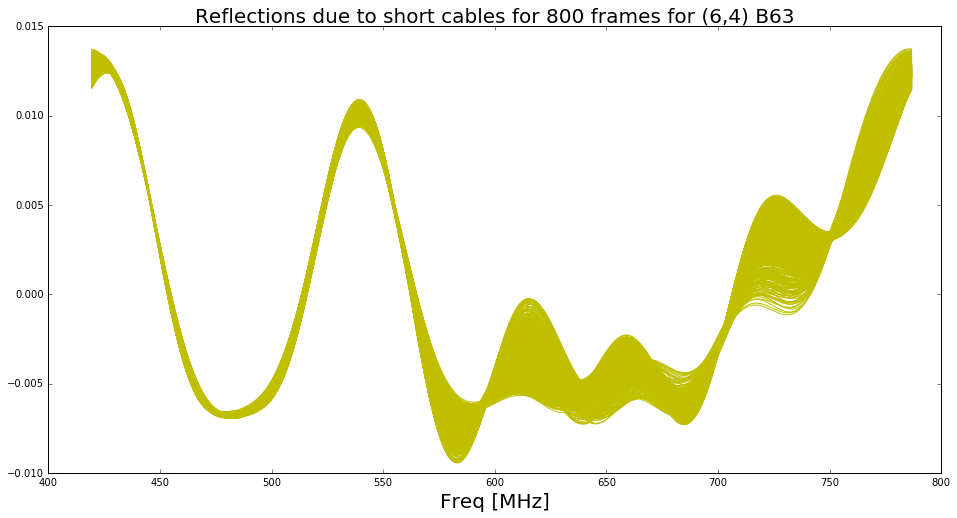

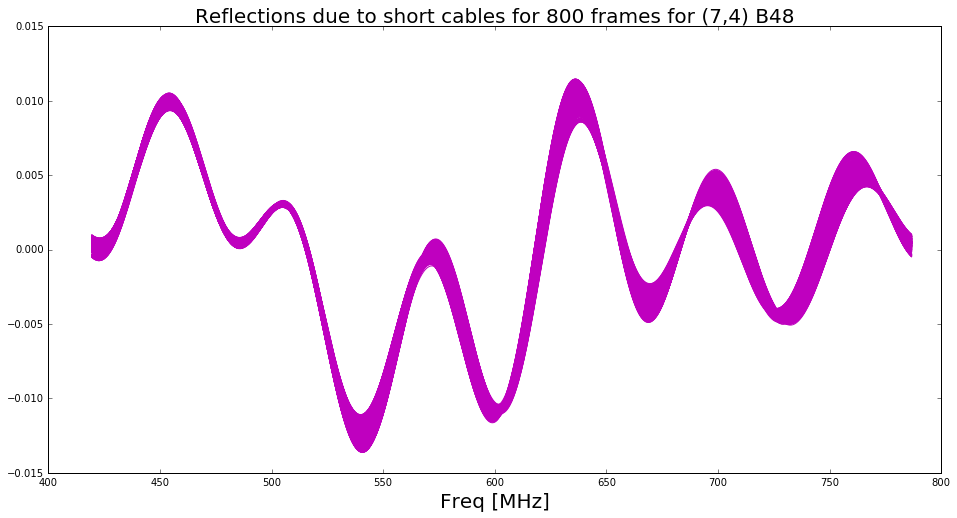

In [23]:
value_all_600 =[]
reflections_ref_val_600 = []
gain_all_line_sub=[]

for i in range(len(corr_list)):
    value_all_600.append([])
    reflections_ref_val_600.append([])

for k in range(len(corr_list)):
    print(k)
    value_all_600[k] = np.zeros((800,len(freq_phase[50:990])))
    fft_reflections_ref=[]
    
    for ii in range(800):
        components=[]
        amplitude =[]
        z=np.polyfit(freq_phase[50:990], gain_all[ii,k,:],1)
        p=np.poly1d(z)
        gain_line_sub = gain_all[ii,k,:] - p(freq_phase[50:990])
        gain_all_line_sub.append(gain_line_sub)

        ifft_component = np.fft.ifft(gain_line_sub)  
        ifft_component0 = np.fft.ifft(gain_line_sub) 
        end = len(ifft_component)
        '''
        for i in range(end):
            if np.abs(ifft_component[i]) > 18*np.mean(np.abs(ifft_component)):#-np.mean(np.abs(ifft_component))/2:
                components.append(i)
                amplitude.append(np.abs(ifft_component[i]))
        '''        
        for i in range(end):
            if (i<7) or (i>931):
                components.append(i)
        
        for i in range(len(ifft_component)):
            if i not in components: 
                ifft_component0[i] = 0
        
        fft_reflections = np.fft.fft(ifft_component0) 
        if ii==0:
            fft_reflections_ref = fft_reflections
        
        for kk in range(len(freq_phase[50:990])):
            value_all_600[k][ii][kk] = fft_reflections[kk] - fft_reflections_ref[kk]
            if kk == freq:
                reflections_ref_val_600[k] = fft_reflections_ref[kk]
            
        plt.figure(k+1)
        plt.plot(freq_phase[50:990],fft_reflections, color=colors[k])
        plt.title('Reflections due to short cables for 800 frames for %s' %(legend_crosscorr[k]), size=20)
        plt.xlabel('Freq [MHz]', size=20)
    #plt.savefig('reflection_short cables %s.png' %(legend_crosscorr[k]))
    

In [ ]:
for k in range(len(corr_list)):
    
    plt.figure(k+1)
    plt.plot(date_stamp[0:800],value_all_600[k][:,freq], 'y', label=str(freq_phase[freq]))
    plt.plot(date_stamp[0:800],value_all_600[k][:,freq+1],'k', label=str(freq_phase[freq+1]))
    plt.plot(date_stamp[0:800],value_all_600[k][:,freq+2],'g', label=str(freq_phase[freq+2]))
    plt.plot(date_stamp[0:800],value_all_600[k][:,200],'r', label=str(freq_phase[200]))
    plt.plot(date_stamp[0:800],value_all_600[k][:,300],'.r', label=str(freq_phase[300]))
    plt.plot(date_stamp[0:800],value_all_600[k][:,600],'--r', label=str(freq_phase[600]))
    plt.plot(time_intercept_model[0:800],(2*((temp_intercept_model[0:800]+273)/10000 -0.057)+0.035)+0.023, 'k',linewidth =4,label= ' Scaled Weather data ')   
    plt.plot(time_intercept_model[0:800],-(2*((temp_intercept_model[0:800]+273)/10000 -0.057)+0.035+0.023), 'k',linewidth =4,label= ' Scaled Weather data ')
    #plt.plot(time_intercept_model[0:800],(2*((temp_intercept_model[0:800]+273)/10000 -0.057)+0.035)-0.023, 'k',linewidth =4,label= ' Scaled Weather data ')   
    plt.title('reflections due to short cables at 6 frequencies')
    plt.xlabel('Date/Time', size=20)
    plt.legend()

In [ ]:
for k in range(len(corr_list)):
    for i in range(len(freq_phase[690:990])):
        plt.figure(k+1)
        plt.plot(date_stamp[0:800],value_all_600[k][:,freq-150+i])
    plt.plot(time_intercept_model[0:800],-(2*((temp_intercept_model[0:800]+273)/8000 -0.057)+0.006+0.04)+0.003, 'k',linewidth =4,label= ' Scaled Weather data ')   
    plt.plot(time_intercept_model[0:800],-(-(2*((temp_intercept_model[0:800]+273)/8000 -0.057)+0.006+0.04)+0.003), 'b',linewidth =4,label= ' Scaled Weather data ')
    plt.title('Reflections: Short Cables sliced over frequency: Reflection(t)- Reflection(ref) %s' %(legend_crosscorr[k]), size=20) 
    plt.xlabel('Date/Time', size=20)
    #plt.savefig('diff_reflection_short cables %s.png' %(legend_crosscorr[k]))

# Reflections due to long cables

0


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\ipykernel\__main__.py:46: ComplexWarning: Casting complex values to real discards the imaginary part
C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


1
2
3
4
5
6


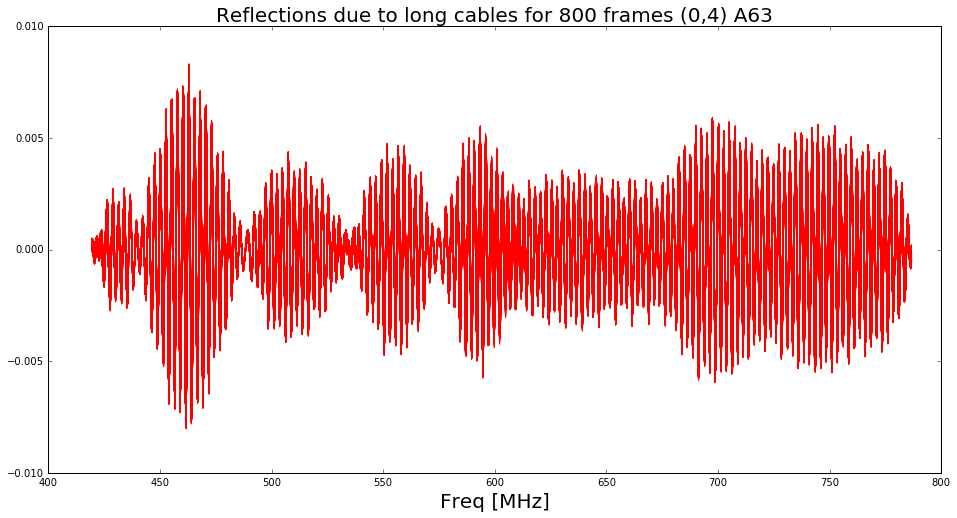

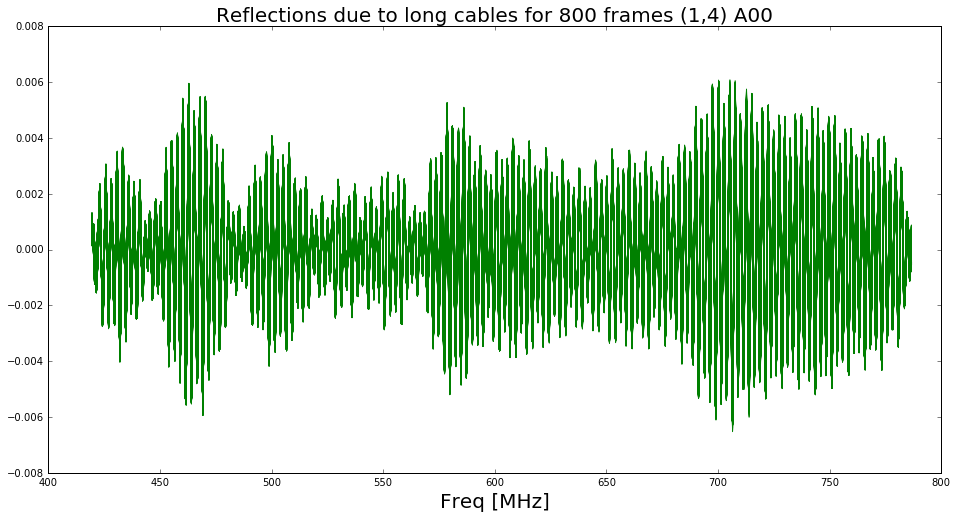

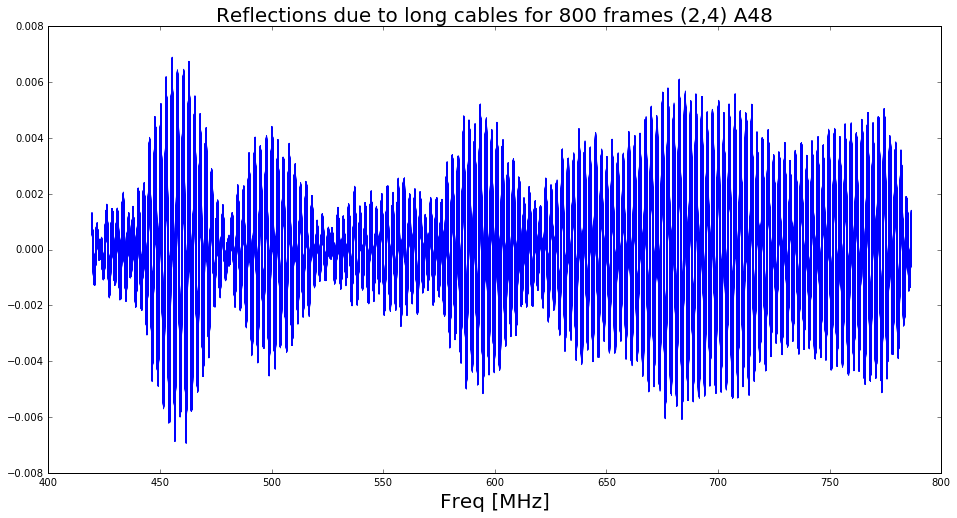

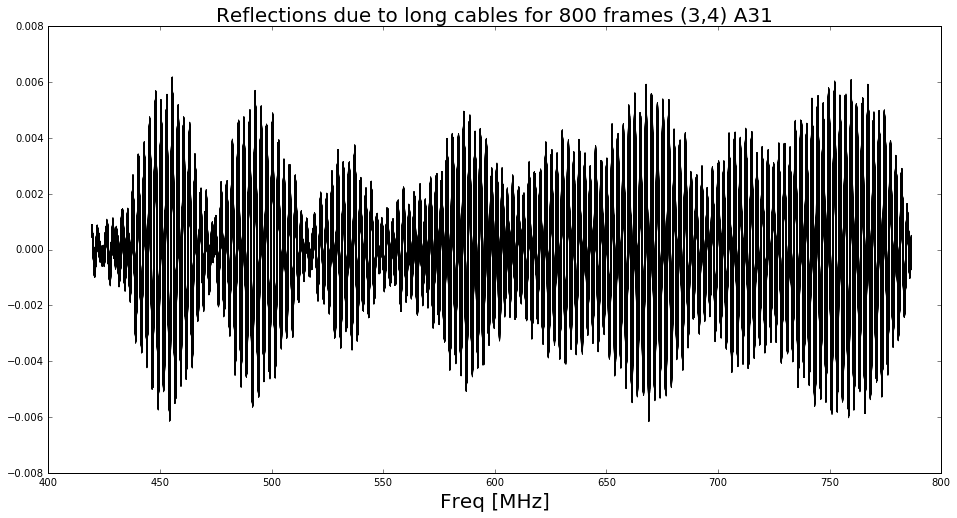

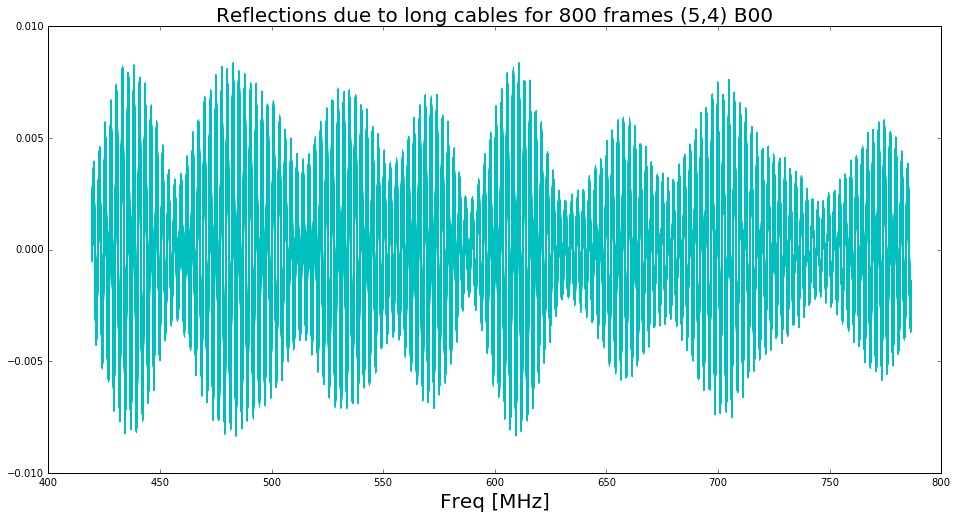

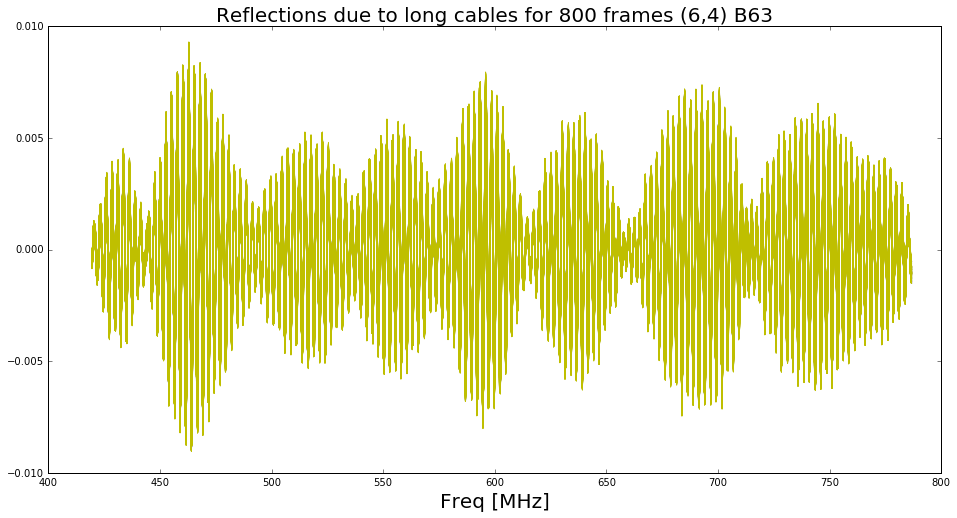

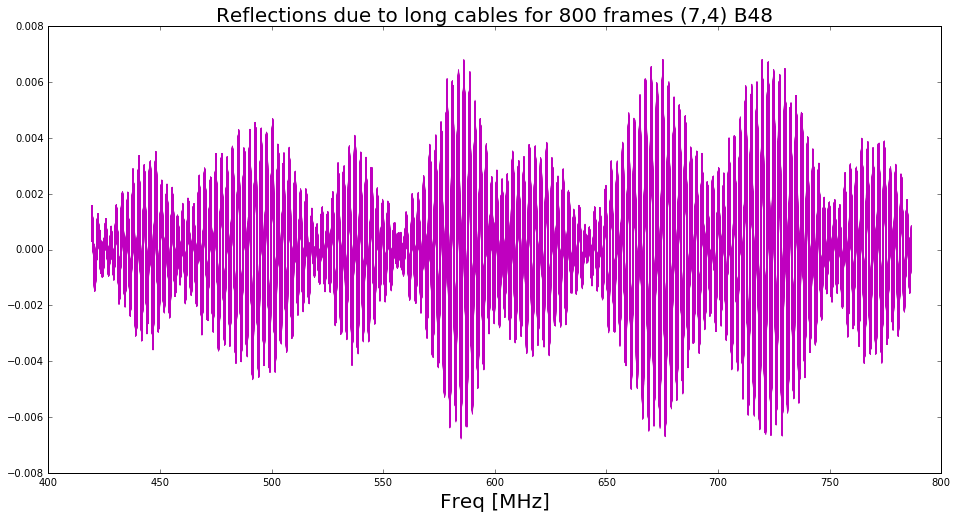

In [91]:
value_all_long_600 =[]
reflections_ref_long_val_600 = []
gain_all_line_sub=[]

for i in range(len(corr_list)):
    value_all_long_600.append([])
    reflections_ref_long_val_600.append([])
    
for k in range(len(corr_list)):
    print(k)
    value_all_long_600[k] = np.zeros((800,len(freq_phase[50:990])))
    fft_reflections_ref=[]
    
    for ii in range(800):
        components=[]
        amplitude =[]
        z=np.polyfit(freq_phase[50:990], gain_all[ii,k,:],1)
        p=np.poly1d(z)
        gain_line_sub = gain_all[ii,k,:] - p(freq_phase[50:990])
        gain_all_line_sub.append(gain_line_sub)

        ifft_component = np.fft.ifft(gain_line_sub)  
        ifft_component0 = np.fft.ifft(gain_line_sub) 
        end = len(ifft_component)
        '''
        for i in range(end):
            if np.abs(ifft_component[i]) > 18*np.mean(np.abs(ifft_component)):#-np.mean(np.abs(ifft_component))/2:
                components.append(i)
                amplitude.append(np.abs(ifft_component[i]))
        '''        
        for i in range(end):
            if (i>134 and i<154) or (i>780 and i<810) or i== 141 or i==841:
                components.append(i)
                amplitude.append(np.abs(ifft_component[i]))
        
        for i in range(len(ifft_component)):
            if i not in components: 
                ifft_component0[i] = 0
        
        fft_reflections = np.fft.fft(ifft_component0) 
        if ii==0:
            fft_reflections_ref = fft_reflections
        
        for kk in range(len(freq_phase[50:990])):
            
            value_all_long_600[k][ii][kk] = fft_reflections[kk] - fft_reflections_ref[kk]
            if kk == freq:
                reflections_ref_long_val_600[k] = fft_reflections_ref[kk]
        plt.figure(k+1)
        plt.plot(freq_phase[50:990],fft_reflections, color=colors[k])
        plt.title('Reflections due to long cables for 800 frames %s' %(legend_crosscorr[k]), size=20)
        plt.xlabel('Freq [MHz]', size=20)

    

In [ ]:
for k in range(len(corr_list)):
    for i in range(len(freq_phase[690:990])):
        plt.figure(k+1)
        plt.plot(date_stamp[0:800],value_all_long_600[k][:,freq-150+i])
    plt.plot(time_intercept_model[0:800],(-2*(temp_intercept_model[0:800]+273)/15000 +0.0375), 'k',linewidth =4,label= ' Scaled Weather data ')   
    #plt.plot(time_intercept_model[0:800],(-(2*((temp_intercept_model[0:800]+273)/15000 -0.057)+0.006+0.04)+0.003)-0.015-0.02, 'k',linewidth =4,label= ' Scaled Weather data ')   
    #plt.plot(time_intercept_model[0:800],-((-(2*((temp_intercept_model[0:800]+273)/15000 -0.057)+0.006+0.04)+0.003)-0.015-0.02), 'b',linewidth =4,label= ' Scaled Weather data ')
    plt.title('Reflections: Long Cables sliced over frequency: Reflection(t)- Reflection(ref) %s' %(legend_crosscorr[k]), size=20) 
    
    plt.xlabel('Date/Time', size=20)              
    plt.xlabel('Date/Time', size=20)

In [ ]:
print(time_intercept_model[0])
print(date_stamp[0])
print(freq_phase[freq+42])
print(len(value_all_long_600[k][:,freq]))

0
1
2
3
4
5
6


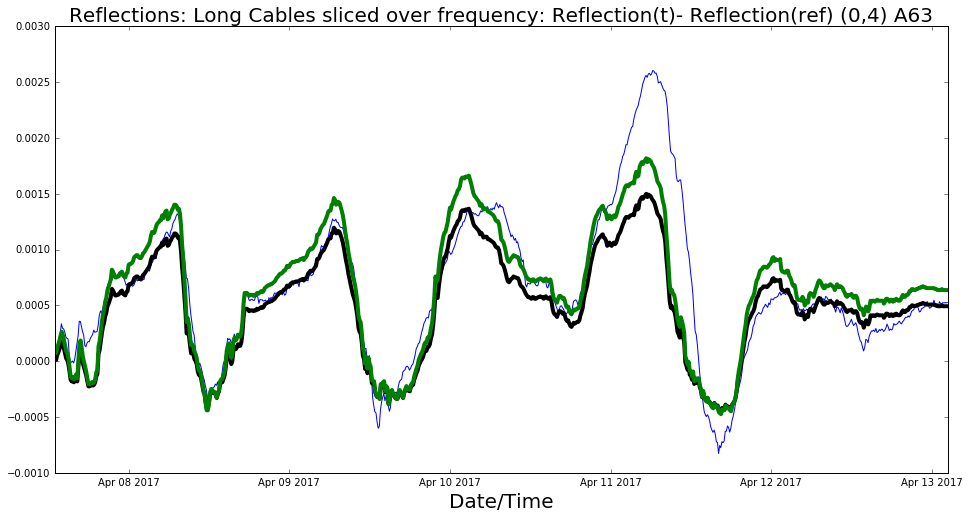

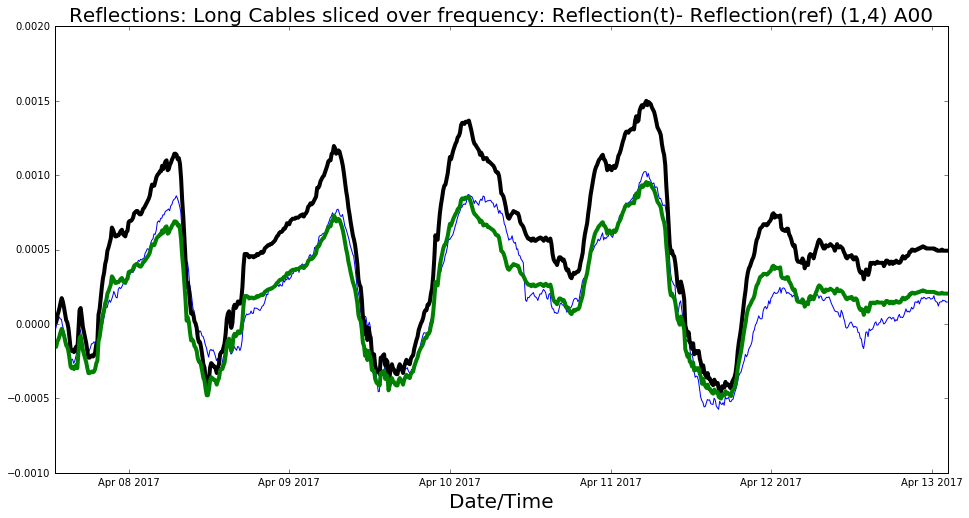

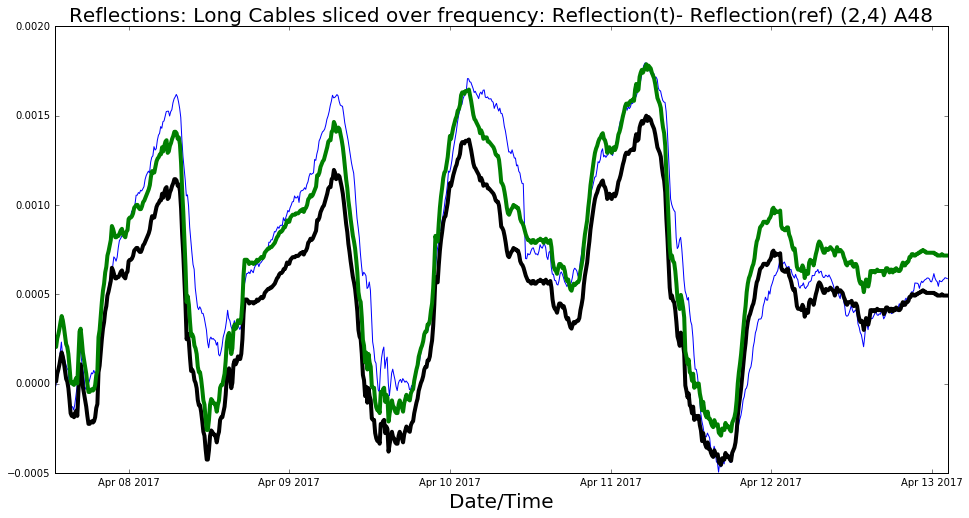

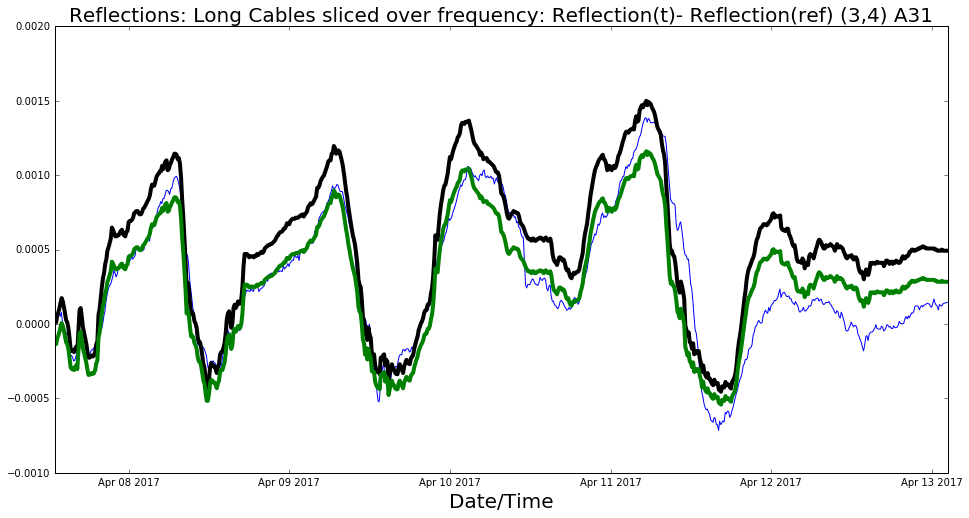

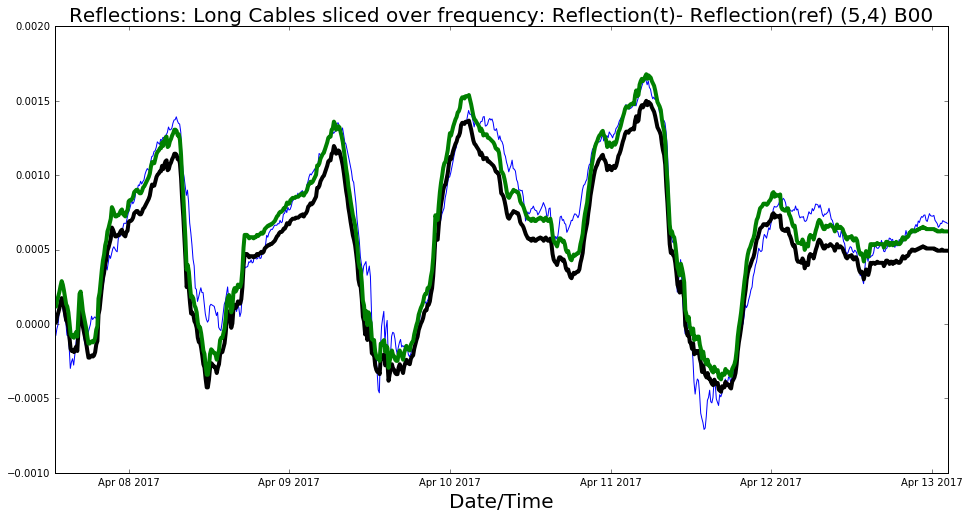

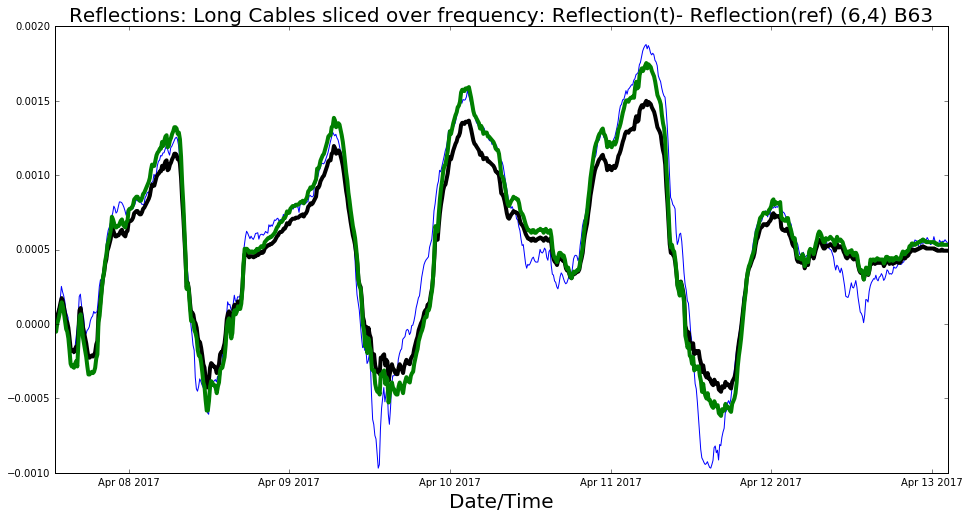

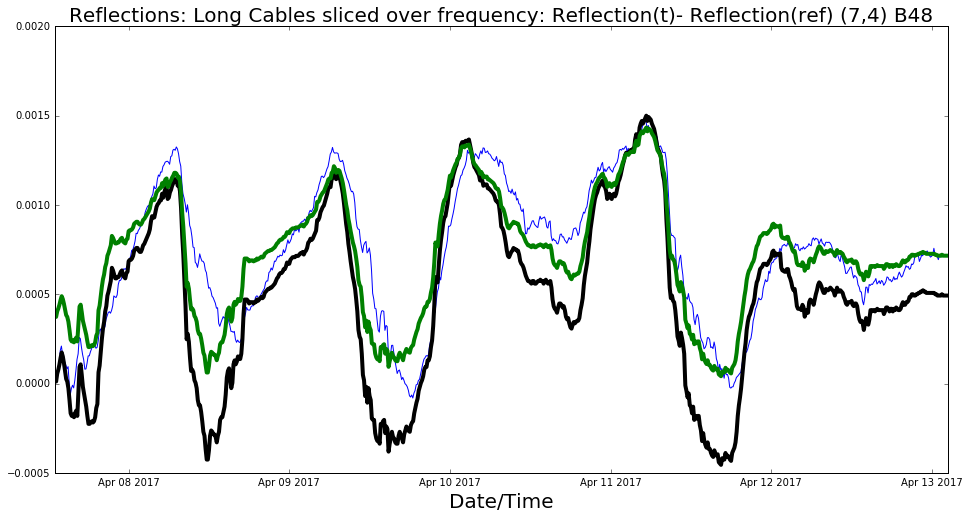

In [92]:
import scipy.optimize as optimization
from scipy.optimize import curve_fit
def func(T,a,b,c):
    return a*(T/b) + c

for k in range(len(corr_list)):
    print(k)
    
    plt.figure(k+1)
    plt.plot(date_stamp[0:800],value_all_long_600[k][:,freq])
    x0 = [-2,15000,0.0375]
    best_vals, covar = curve_fit(func, (temp_intercept_model[0:800]+273), value_all_long_600[k][:,freq], p0 = x0)
    plt.plot(time_intercept_model[0:800],(-2*(temp_intercept_model[0:800]+273)/15000 +0.0375), 'k',linewidth =4) 
    plt.plot(time_intercept_model[0:800],func(temp_intercept_model[0:800]+273,best_vals[0],best_vals[1],best_vals[2]),'g',linewidth =4)
    plt.title('Reflections: Long Cables sliced over frequency: Reflection(t)- Reflection(ref) %s' %(legend_crosscorr[k]), size=20) 
    plt.xlabel('Date/Time', size=20)              

In [ ]:
for k in range(len(corr_list)):
    plt.figure(1)
    frac_chang_gain_cable = (value_all_long_600[0][:,freq] - np.mean(value_all_long_600[0][:,freq]))/np.mean(value_all_long_600[0][:,freq])
    frac_change_gain_temp = ((-2*(temp_intercept_model[0:800]+273)/15000 +0.0375)-np.mean(-2*(temp_intercept_model[0:800]+273)/15000 +0.0375))/np.mean(-2*(temp_intercept_model[0:800]+273)/15000 +0.0375)
    plt.plot(frac_chang_gain_cable)
    plt.plot(frac_change_gain_temp)
    #plt.plot(date_stamp[0:800],frac_chang_gain_cable - frac_change_gain_temp,'.')
    
    plt.title('Residual',  size=20) 
    plt.xlabel('Date/Time', size=20)              
    plt.xlabel('Date/Time', size=20)


In [ ]:
'''
# seing the reflections due to different cables
#looking at single cable

#value_all_long_600 =[]

#for i in range(len(corr_list)):
#    value_all_long_600.append([])

#for k in range(len(corr_list)):
#    value_all_long_600[k] = np.zeros((800,len(freq_phase[50:990])))
#    fft_reflections_ref=[]

k=1
value_all_long_600 = np.zeros((800,len(freq_phase[50:990])))
fft_reflections_ref=[]
gain_all_line_sub=[]
plt.figure(1)
plt.figure(figsize(16,8))
#plt.title('reflections: 1,2,3,4,5,6,7,8,9,10,11')
for ii in range(800):

    z=np.polyfit(freq_phase[50:990], gain_all[ii,k,:],1)
    p=np.poly1d(z)
    gain_line_sub = gain_all[ii,k,:] - p(freq_phase[50:990])
    gain_all_line_sub.append(gain_line_sub)

    ifft_component = np.fft.ifft(gain_line_sub)  
    end = len(ifft_component)
    
    #i_val_check = [1,2,3,4,5,6,7,8,9,10,11]
    i_val_check = [134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153]
    
    for kkk in range(len(i_val_check)):
        ifft_component0 = np.fft.ifft(gain_line_sub) 
        
        for i in range(end):
            if i!= i_val_check[kkk]:
                ifft_component0[i] = 0
        plt.subplot(10,2,kkk+1)
        plt.plot(freq_phase[50:990],np.fft.fft(ifft_component0))
        #plt.title('i= %i'%(i_val_check[kkk]))
'''

In [93]:
import scipy.optimize as optimization
from scipy.optimize import curve_fit
def func(T,a,b,c):
    return a*(T/b) + c

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\matplotlib\axes\_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


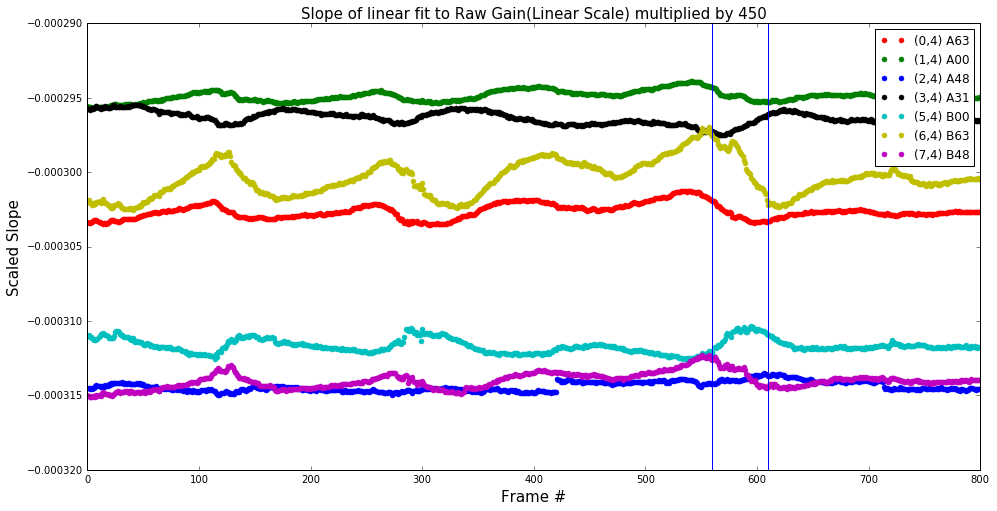

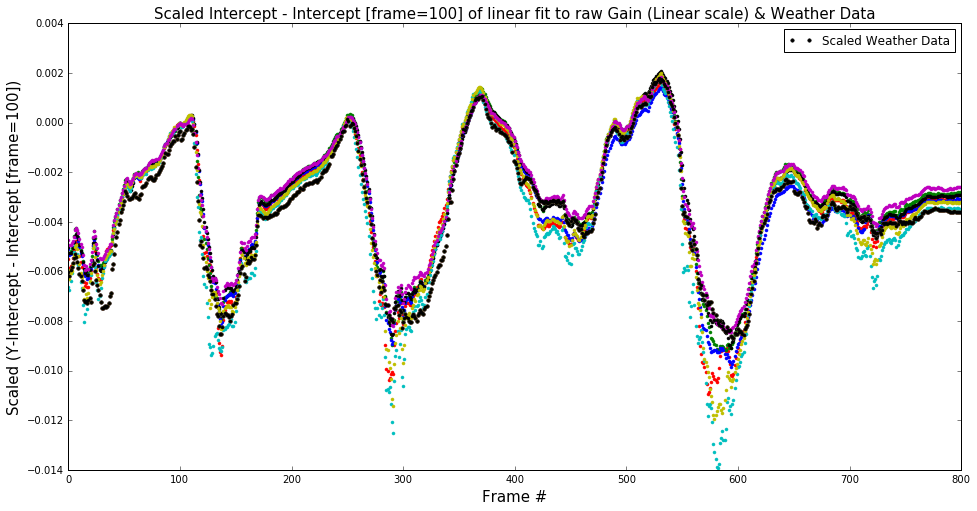

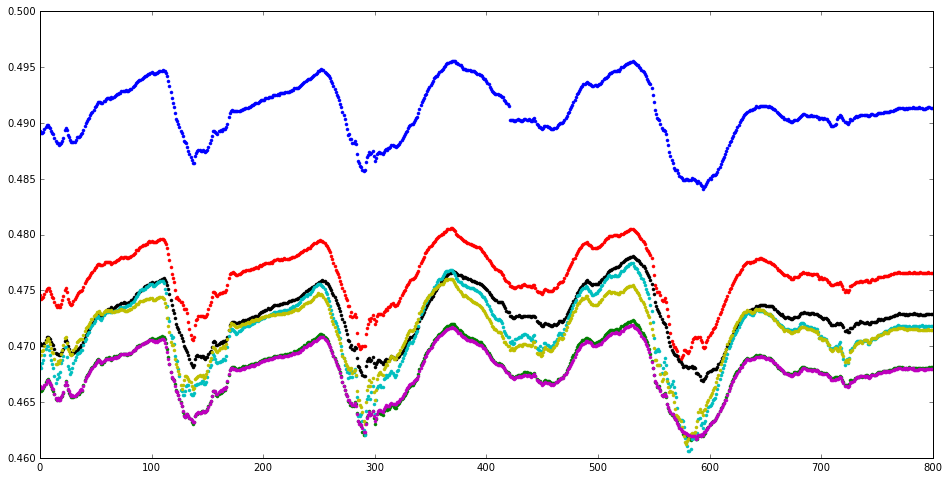

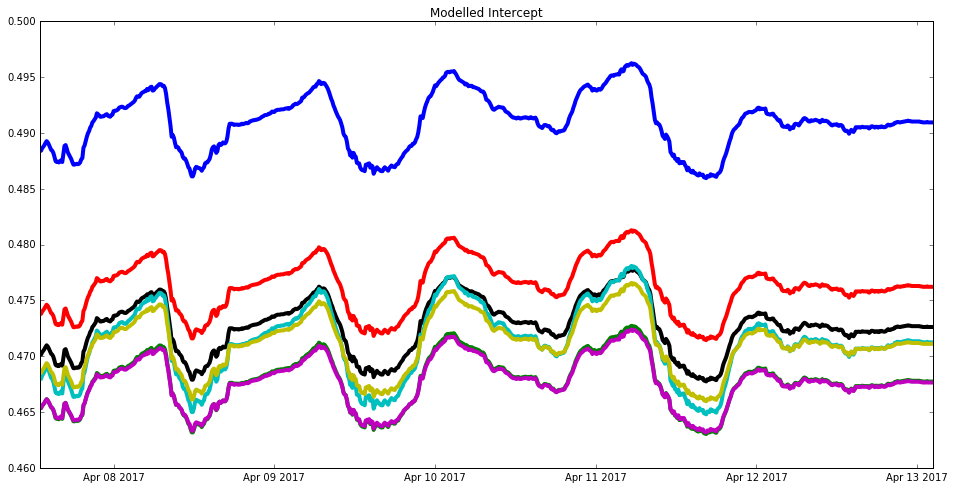

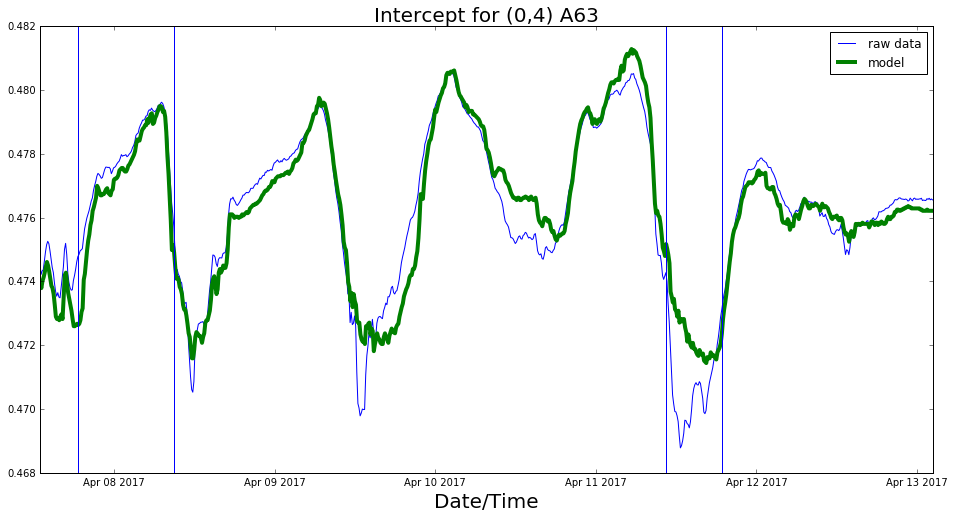

...

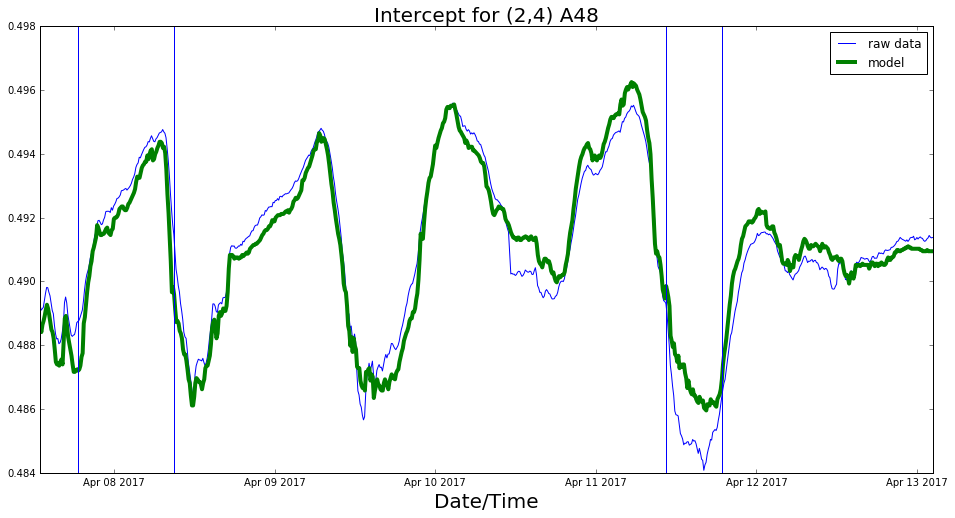

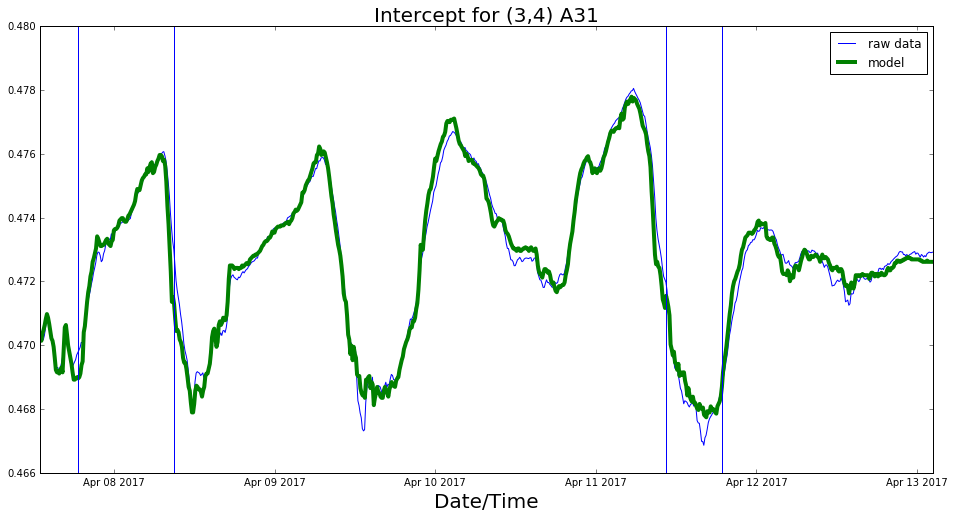

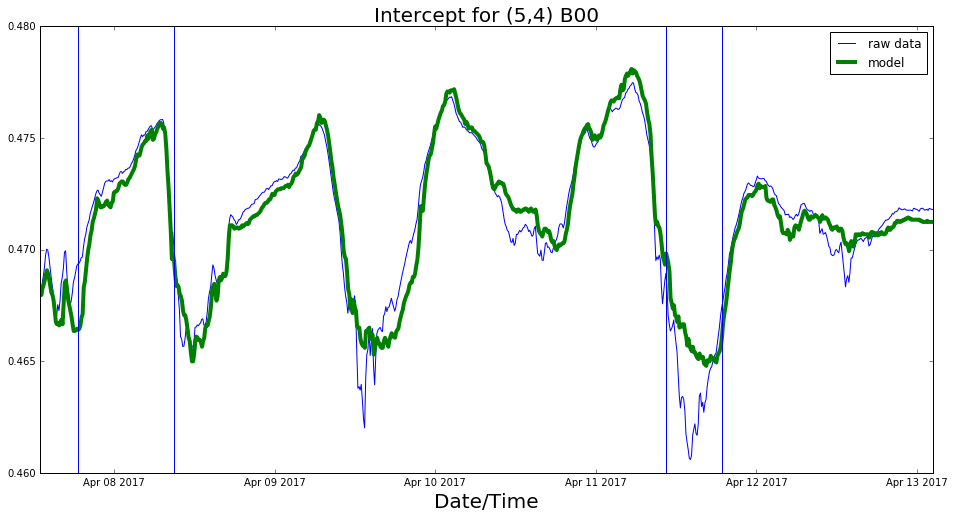

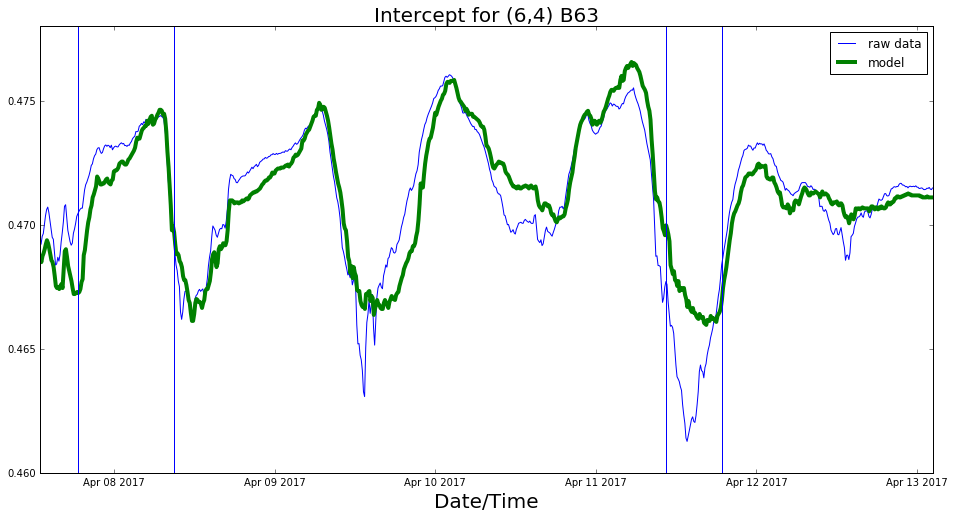

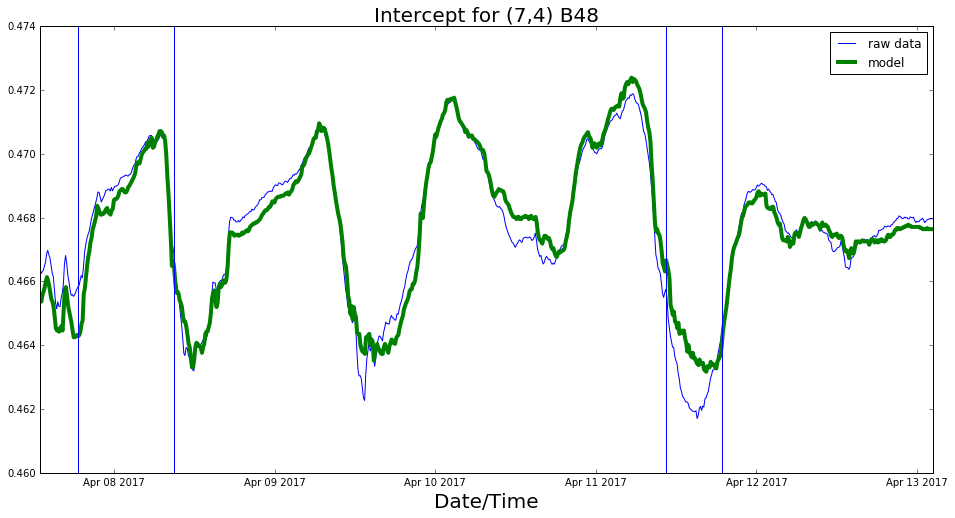

In [94]:
size=800 #len(gain_all[:,1,freq])#1250#421

for i in range(len(corr_list)):
    slope_all =np.zeros(len(gain_all[0:size,1,freq]))
    slope_all_wo_ref =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all_wo_ref =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all =np.zeros(len(gain_all[0:size,1,freq]))
    
    for j in range(size):
        slope,intercept=np.polyfit(freq_phase[50:990]-freq_phase[freq], gain_all[j,i,:],1)
        slope_all[j] = slope
        intercept_all[j] = intercept
        
        slope,intercept=np.polyfit(freq_phase[50:990], gain_all[j,i,:],1)
        slope_all_wo_ref[j] = slope
        intercept_all_wo_ref[j] = intercept
        
    
    plt.figure(1)
    plt.title('Slope of linear fit to Raw Gain(Linear Scale) multiplied by 450', size=15)
    plt.xlabel('Frame #', size=15)
    plt.ylabel('Scaled Slope', size=15)
    plt.plot(slope_all, '.', markersize =10, color=colors[i], label = legend_crosscorr[i])
    #plt.ylim(-0.145,-0.125)
    plt.legend()
    plt.axvline(x=580+30)
    plt.axvline(x=580-20)
    plt.figure(2)
    if i==1: 
        plt.plot(-(temp_intercept_model[0:size]+235)/1400 +0.235-0.019-0.0205-0.015-0.013,'.k',markersize=7, label ='Scaled Weather Data')

    plt.title('Scaled Intercept - Intercept [frame=100] of linear fit to raw Gain (Linear scale) & Weather Data', size=15)
    plt.plot(intercept_all-intercept_all[100], '.', color=colors[i])
    plt.plot(-(temp_intercept_model[0:size]+235)/1400 +0.235-0.019-0.0205-0.015-0.013,'.')
    plt.xlabel('Frame #', size=15)
    plt.ylabel('Scaled (Y-Intercept - Intercept [frame=100])', size=15)
    plt.legend()
    #plt.plot(-temp_weather_data/1400-.001, '.')

    plt.figure(3)
    plt.plot(intercept_all_wo_ref, '.', color=colors[i])
    
    plt.figure(5+i)
    plt.plot(date_stamp[0:800],intercept_all_wo_ref, label='raw data')
    x0 = [-2,15000,0.0375]
    best_vals, covar = curve_fit(func, (temp_intercept_model[0:800]+273), intercept_all_wo_ref, p0 = x0)
    
    plt.plot(time_intercept_model[0:800],func(temp_intercept_model[0:800]+273,best_vals[0],best_vals[1],best_vals[2]),'g',linewidth =4, label = 'model')
    plt.title('Intercept for %s' %(legend_crosscorr[i]), size=20) 
    plt.xlabel('Date/Time', size=20)  
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.legend()
    
    plt.figure(4)
    plt.title('Modelled Intercept')
    plt.plot(time_intercept_model[0:800],func(temp_intercept_model[0:800]+273,best_vals[0],best_vals[1],best_vals[2]),color=colors[i],linewidth =4)
    
    

In [95]:
'''
# not working on model for slope because the change in value of slope is very small

size=800 #len(gain_all[:,1,freq])#1250#421
slope_parameters=[]
intercept_parameters=[]

slope_all_wo_ref=[]
intercept_all_wo_ref=[]

slope_all_wo_ref=[] # I might use them
intercept_all_wo_ref=[] # i might use them

for i in range(len(corr_list)):
    slope_parameters.append([])
    intercept_parameters.append([])
    slope_all_wo_ref.append([])
    intercept_all_wo_ref.append([])
    
for i in range(len(corr_list)):
    slope_all_wo_ref[i] =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all_wo_ref[i] =np.zeros(len(gain_all[0:size,1,freq]))
    
    for j in range(size):
        slope,intercept=np.polyfit(freq_phase[50:990], gain_all[j,i,:],1)
        slope_all_wo_ref[i][j] = slope
        intercept_all_wo_ref[i][j] = intercept
        
    x0 = [-2,15000,0.0375]
    best_vals_intercept, covar = curve_fit(func, (temp_intercept_model[0:800]+273), intercept_all_wo_ref[i], p0 = x0)
    best_vals_slope, covar_slope = curve_fit(func, (temp_intercept_model[0:800]+273), slope_all_wo_ref[i], p0 = x0)
    intercept_parameters[i] = best_vals_intercept
    
    slope_parameters[i] =  best_vals_slope#np.mean(slope_all_wo_ref)
'''
# not working on model for slope because the change in value of slope is very small

size=800 #len(gain_all[:,1,freq])#1250#421
slope_parameters=[]
intercept_parameters=[]
slope_all_wo_ref=[]
intercept_all_wo_ref=[]

for i in range(len(corr_list)):
    slope_parameters.append([])
    intercept_parameters.append([])
    slope_all_wo_ref.append([])
    intercept_all_wo_ref.append([])
    
for i in range(len(corr_list)):
    slope_all_wo_ref[i] =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all_wo_ref[i] =np.zeros(len(gain_all[0:size,1,freq]))
    intercept_all =np.zeros(len(gain_all[0:size,1,freq]))
    
    for j in range(size):
        slope,intercept=np.polyfit(freq_phase[50:990], gain_all[j,i,:],1)
        slope_all_wo_ref[i][j] = slope
        intercept_all_wo_ref[i][j] = intercept
        
    x0 = [-2,15000,0.0375]
    best_vals, covar = curve_fit(func, (temp_intercept_model[0:800]+273), intercept_all_wo_ref[i], p0 = x0)
    best_vals_slope, covar_slope = curve_fit(func, (temp_intercept_model[0:800]+273), slope_all_wo_ref[i], p0 = x0)
    intercept_parameters[i] = best_vals
    
    slope_parameters[i] =  best_vals_slope#np.mean(slope_all_wo_ref)


In [96]:
freq_phase_model = freq_phase[50:990]

gain_linear_model_600=[]
gain_linear_raw_600=[]

for i in range(len(corr_list)):
    gain_linear_model_600.append([])
    gain_linear_raw_600.append([])
    
for i in range(len(corr_list)):
    gain_linear_model_600[i]= np.zeros(size)
    gain_linear_raw_600[i]= np.zeros(size)
    
    for k in range(size):
        #gain_linear_model_600[i][k] = slope_parameters[i]*freq_phase_model[freq] + func(temp_intercept_model[k]+273,intercept_parameters[i][0], intercept_parameters[i][1], intercept_parameters[i][2])
        gain_linear_model_600[i][k] = func(temp_intercept_model[k]+273,slope_parameters[i][0], slope_parameters[i][1], slope_parameters[i][2])*freq_phase_model[freq] + func(temp_intercept_model[k]+273,intercept_parameters[i][0], intercept_parameters[i][1], intercept_parameters[i][2])
        gain_raw = gain_all[k,i,:]
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_raw_all = p(freq_phase[50:990])
        gain_linear_raw_600[i][k] = gain_raw_all[freq]

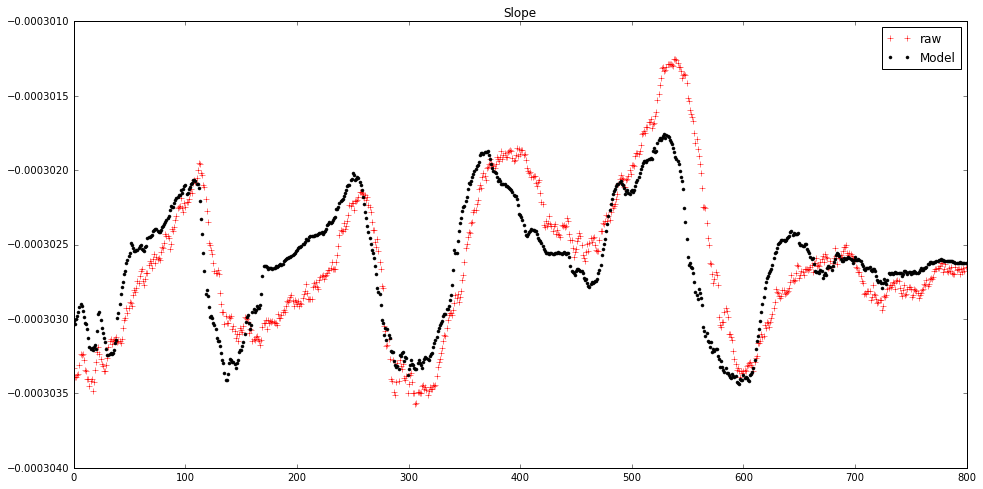

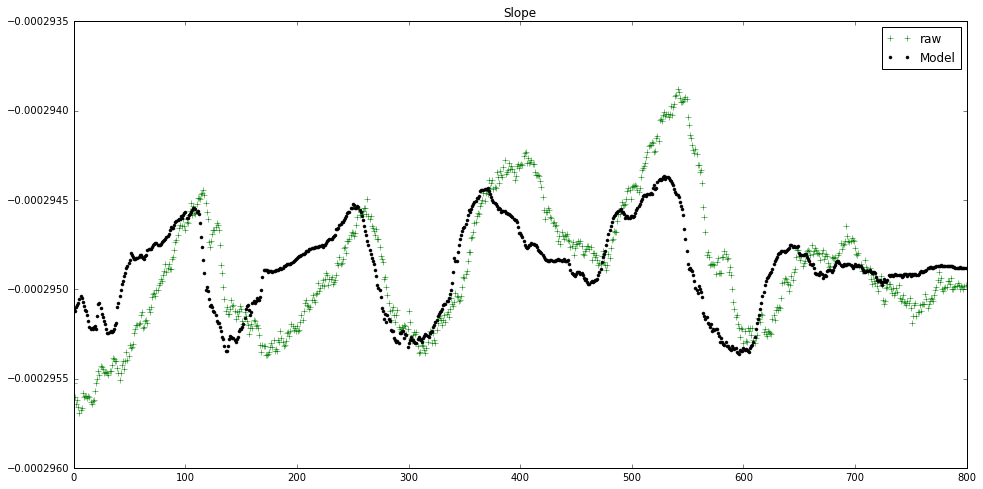

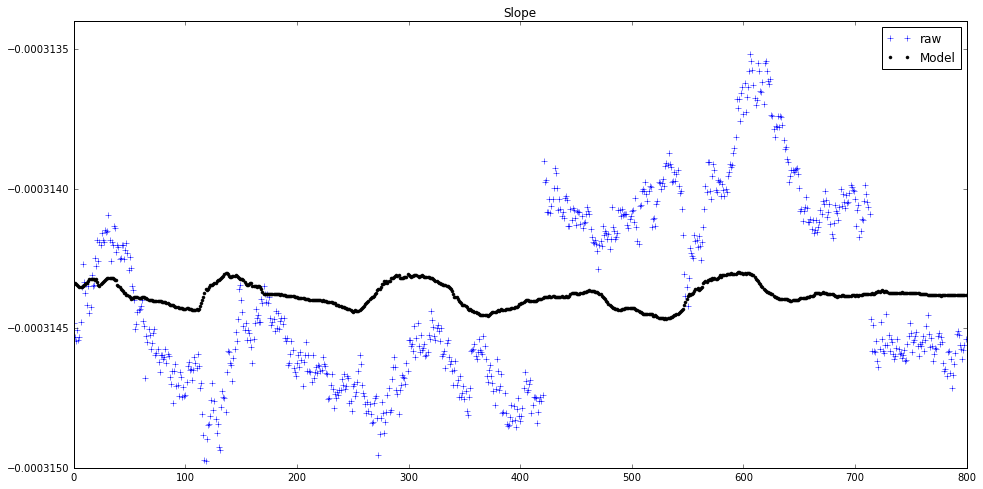

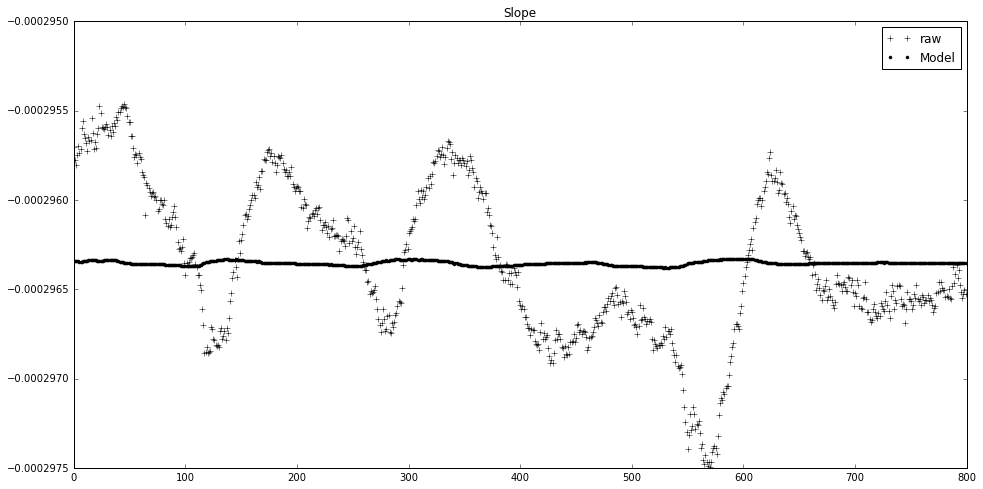

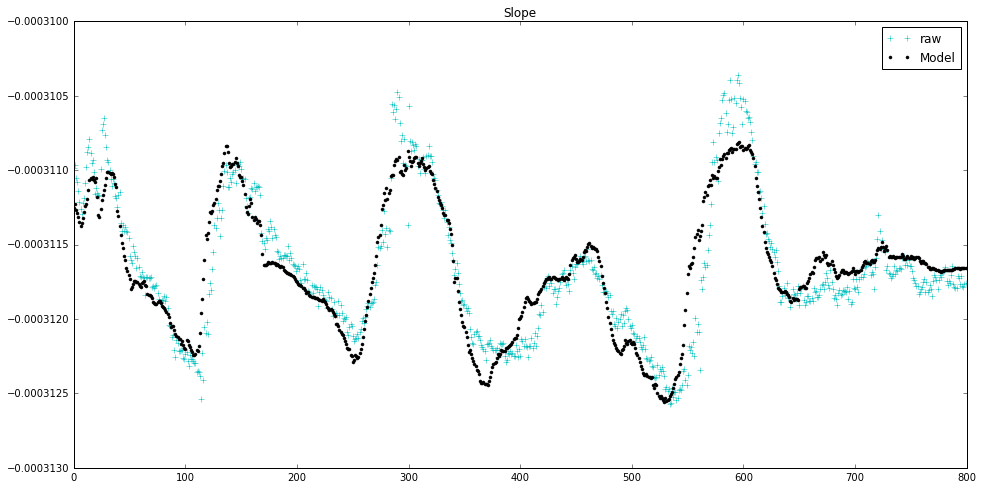

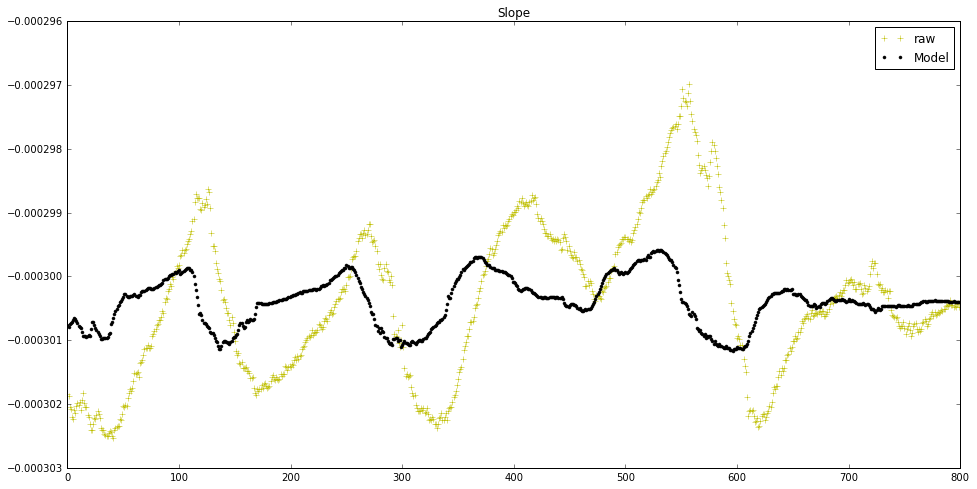

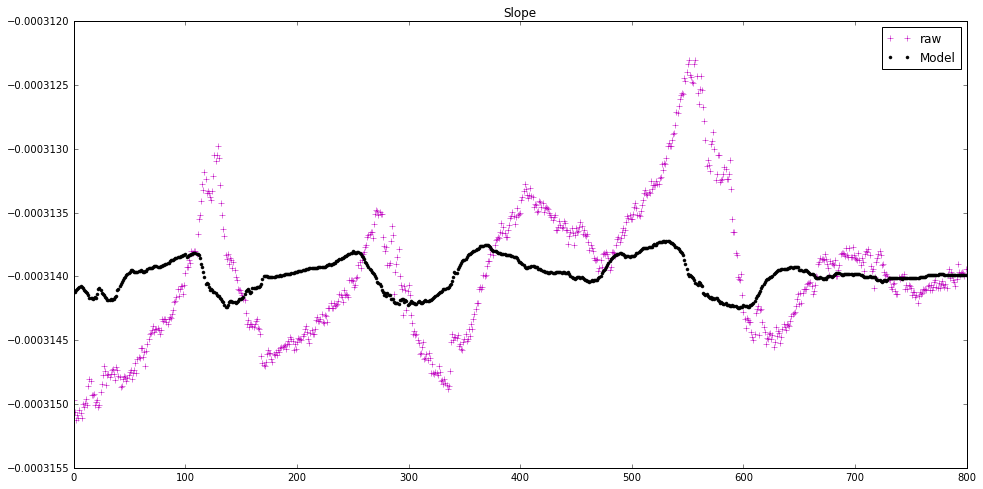

In [97]:
slope_model=[]

for i in range(len(corr_list)):
    slope_model.append([])
    
for i in range(len(corr_list)):
    slope_model[i] = func(temp_intercept_model[0:size]+273,slope_parameters[i][0], slope_parameters[i][1], slope_parameters[i][2])
    plt.figure(i+1)
    plt.title('Slope')
    plt.plot(slope_all_wo_ref[i],'+', color=colors[i],label='raw')
    plt.plot(slope_model[i],'.k', label='Model')
    plt.legend()

In [ ]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    plt.title('Linear part of model for cable %s @ 600 MHz' %(legend_crosscorr[i]), size=20)
    plt.plot(gain_linear_model_600[i], '.', color=colors[i], label='Modelled')
    plt.plot(gain_linear_raw_600[i], '+k', label='Raw Gain Linear part')
    plt.legend()
    plt.axvline(x=[580+30])
    plt.axvline(x=[580-20])
    plt.axvline(x=[120])
    plt.axvline(x=[34])

In [ ]:
for i in range(len(corr_list)):

    if i!= 4:
        plt.figure(1)
        plt.title('RESIDUAL fractional change in gain just for linear part',size=20)
        plt.xlabel('Date/Time',size=20)
        plt.ylabel('Residual',size=20)
        gain_linear_model_600_frac = (gain_linear_model_600[i]-np.mean(gain_linear_model_600[i]))/np.mean(gain_linear_model_600[i])
        gain_linear_raw_600_frac = (gain_linear_raw_600[i]-np.mean(gain_linear_raw_600[i]))/np.mean(gain_linear_raw_600[i])
        plt.plot(date_stamp[0:size],gain_linear_raw_600_frac-gain_linear_model_600_frac,'.', color=colors[i])
        
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
        #plt.legend()

    plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/3000,'k',linewidth =4)
plt.axvline(x=time_intercept_model[360])

In [98]:
def func_reflection(T,a,b,c):
    return a*(T/b) + c 

In [99]:
gain_reflection_raw = []
gain_reflection_model_600=[]
reflection_parameters=[]

for i in range(len(corr_list)):
    gain_reflection_raw.append([])
    reflection_parameters.append([])
    gain_reflection_model_600.append([])
        
for i in range(len(corr_list)):
    gain_reflection_raw[i] =np.zeros(800)
    gain_reflection_model_600[i]= np.zeros(size)
    
    for j in range(size):
        gain_raw = gain_all[j,i,:] # for cable 2
        z=np.polyfit(freq_phase[50:990], gain_raw,1)
        p=np.poly1d(z)
        gain_raw_all = gain_raw - p(freq_phase[50:990])
        gain_reflection_raw[i][j] = gain_raw_all[freq]
        
    x0 = [-1,3000,0.018]
    best_vals, covar = curve_fit(func_reflection, (temp_intercept_model[0:800]+273), gain_reflection_raw[i], p0 = x0)
    reflection_parameters[i] = best_vals
    
    for k in range(size):
        gain_reflection_model_600[i][k] = func_reflection((temp_intercept_model[k]+273), reflection_parameters[i][0], reflection_parameters[i][1], reflection_parameters[i][2])

In [ ]:
print(gain_reflection_model_600[4][0:10])
print(gain_reflection_raw[4][0:10])
print(gain_reflection_model_600[4][0:10]-gain_reflection_raw[4][0:10])

In [ ]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    #plt.title('Reflection part of model for cable %s @ 600 MHz' %(legend_crosscorr[i]), size=20)
    plt.plot(gain_reflection_model_600[i], '.', color=colors[i], label='Modelled')
    plt.plot(gain_reflection_raw[i], '+k', label='Raw Gain Linear part')
    plt.legend()

In [ ]:
for i in range(len(corr_list)):

    if i!= 4:
        plt.figure(1)
        plt.title('RESIDUAL fractional change in gain just for reflection part',size=20)
        plt.xlabel('Date/Time',size=20)
        plt.ylabel('Residual',size=20)
        gain_reflection_model_600_frac = (gain_reflection_model_600[i]-np.mean(gain_reflection_model_600[i]))/np.mean(gain_reflection_model_600[i])
        gain_reflection_raw_600_frac = (gain_reflection_raw[i]-np.mean(gain_reflection_raw[i]))/np.mean(gain_reflection_raw[i])
        plt.plot(date_stamp[0:size],gain_reflection_model_600_frac-gain_reflection_raw_600_frac,'.', color=colors[i])
        
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
        #plt.legend()

    plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/3000,'k',linewidth =4)

In [ ]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    plt.title('Linear part of model for cable %s @ 600 MHz' %(legend_crosscorr[i]), size=20)
    plt.plot(gain_reflection_model_600[i] + gain_linear_model_600[i], '.', color=colors[i], label='Modelled')
    plt.plot(gain_reflection_raw[i] + gain_linear_raw_600[i], '+k', label='Raw Gain Linear part')
    plt.legend()

In [ ]:
for i in range(len(corr_list)):
    if i!=4:
        plt.figure(1)
        plt.title('RESIDUAL fractional change in gain @ 600 MHz # not one we want to see now',size=20)
        plt.xlabel('Date/Time',size=20)
        plt.ylabel('Residual',size=20)
        gain_modelled_total = gain_reflection_model_600[i] + gain_linear_model_600[i]
        gain_raw_total = gain_reflection_raw[i] + gain_linear_raw_600[i]
        gain_model_600_frac = (gain_modelled_total-np.mean(gain_modelled_total))/np.mean(gain_modelled_total)
        gain_raw_600_frac = (gain_raw_total-np.mean(gain_raw_total))/np.mean(gain_raw_total)
        plt.plot(date_stamp[0:size],gain_model_600_frac-gain_raw_600_frac,'.', color=colors[i])

        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)

    #plt.legend()
plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/3000,'k',linewidth =4)



# value_all_600[cable#][days,freq] : short cables
# value_all_long_600[cable#][days,freq] : longt cables

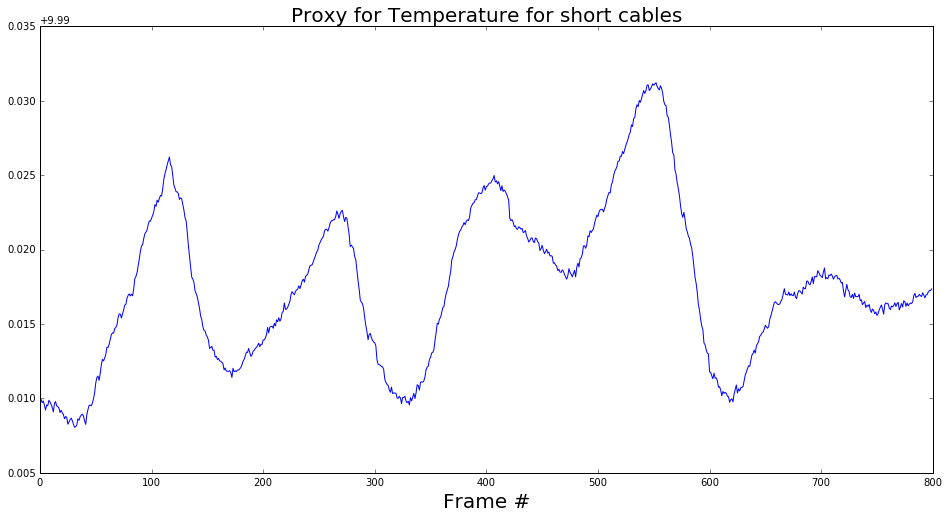

In [100]:
# temperature for shorter cables
freq_selected = [500,501,502,503,504]
k=0
temp_short_cables = np.zeros(size)
for i in range(len(freq_selected)):
    temp_short_cables[:] = temp_short_cables[:] + value_all_600[k][:,freq_selected[i]]+2
plt.plot(temp_short_cables)
plt.title('Proxy for Temperature for short cables', size=20)
plt.xlabel('Frame #', size=20)




2017-04-07 13:00:00


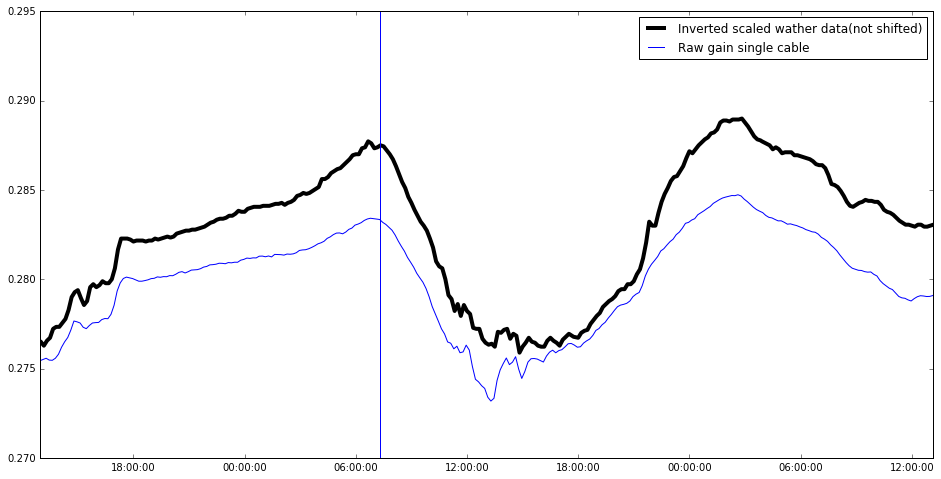

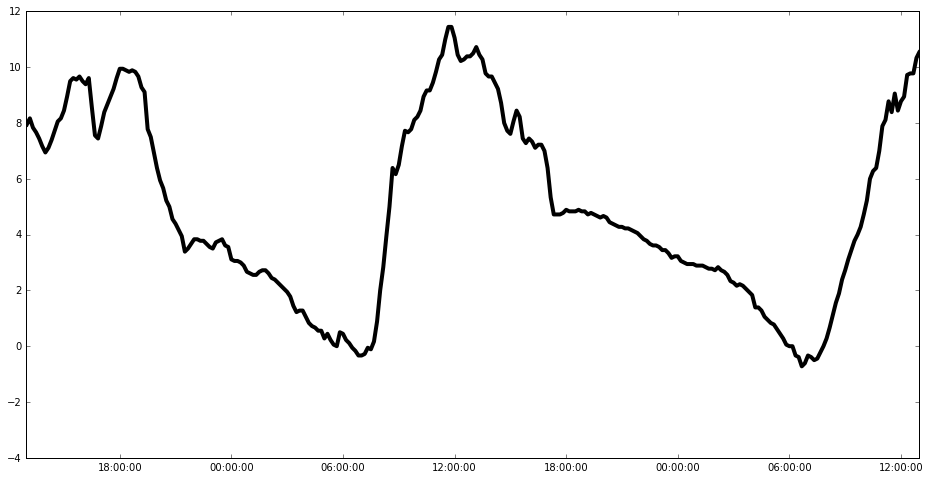

In [33]:
plt.figure(1)
plt.plot(time_intercept_model[0:size],-(temp_intercept_model[0:size]+273)/1000+0.56,'k',linewidth =4,label='Inverted scaled wather data(not shifted)')
plt.plot(date_stamp[0:size], gain_all[0:size,1,freq], label='Raw gain single cable')
plt.axvline(x = date_stamp[110])
plt.axvline(x = date_stamp[254])
plt.legend()
plt.xlim(date_stamp[144*1], date_stamp[144*3])

plt.figure(2)
plt.plot(time_intercept_model[0:size],temp_intercept_model[0:size],'k',linewidth =4,label='scaled wather data(not shifted)')
plt.xlim(date_stamp[0], date_stamp[144*2])
print(time_intercept_model[0])

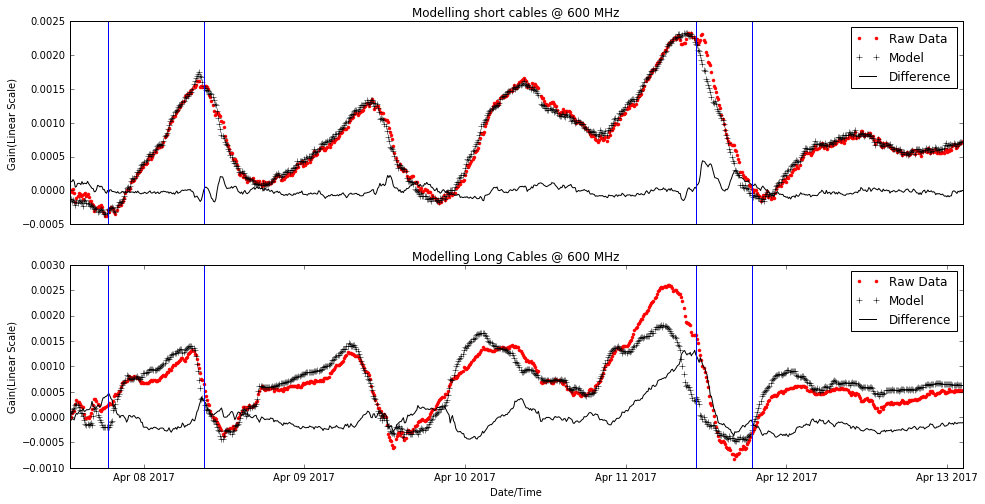

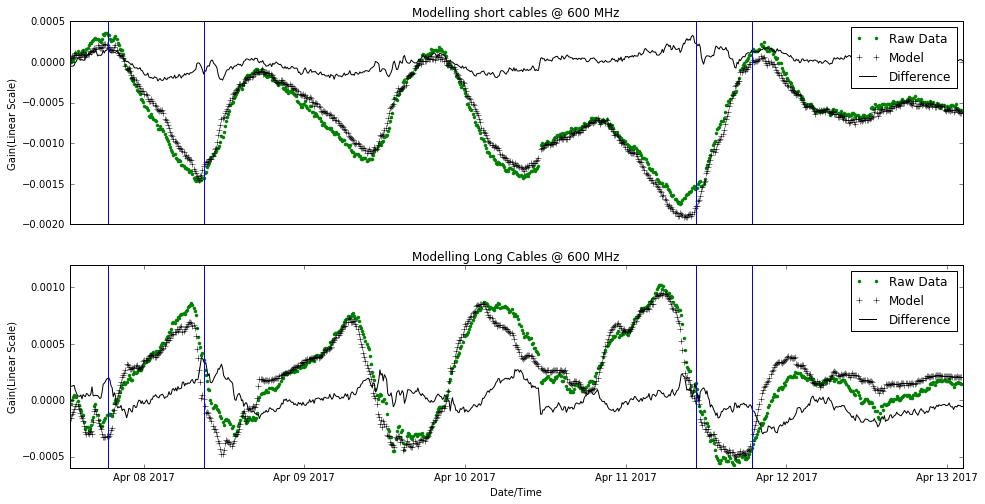

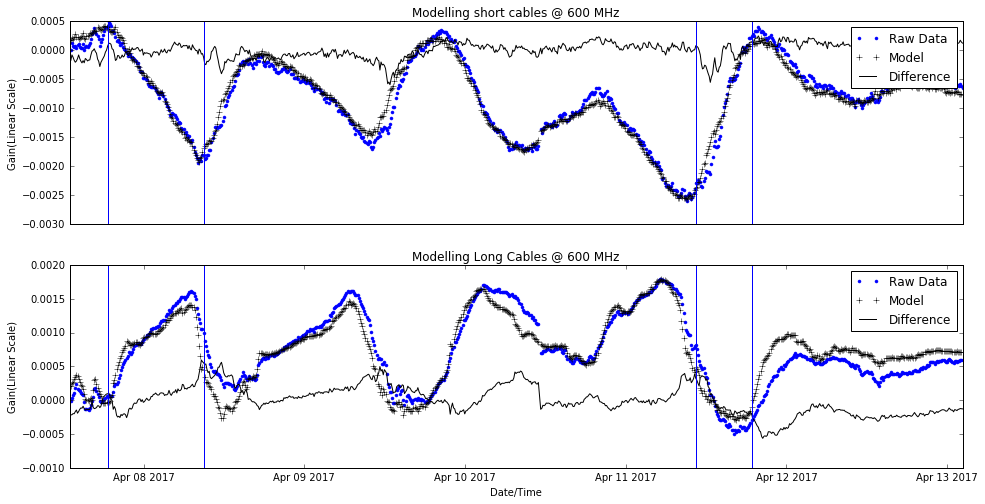

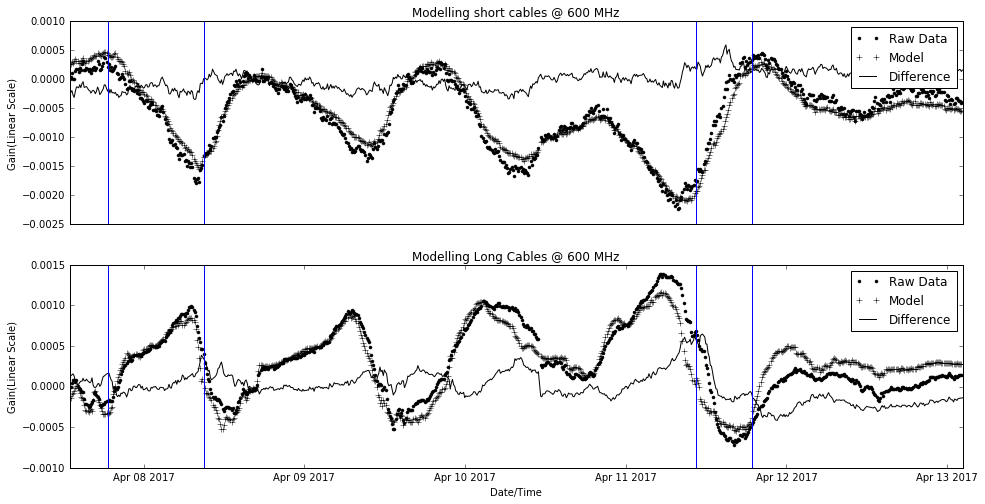

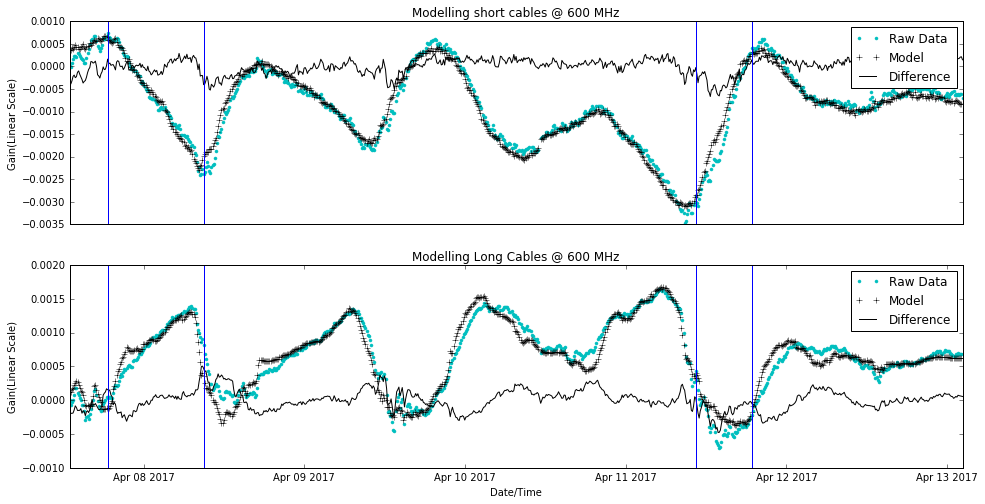

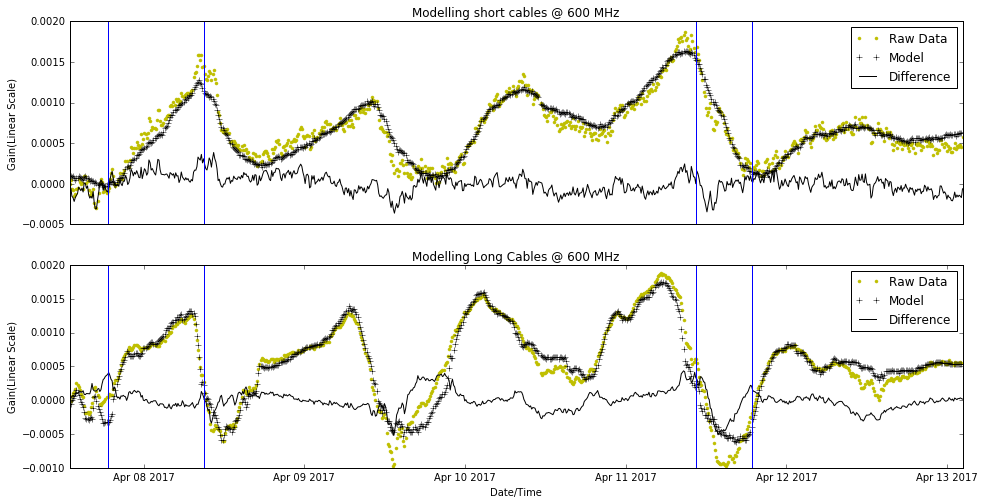

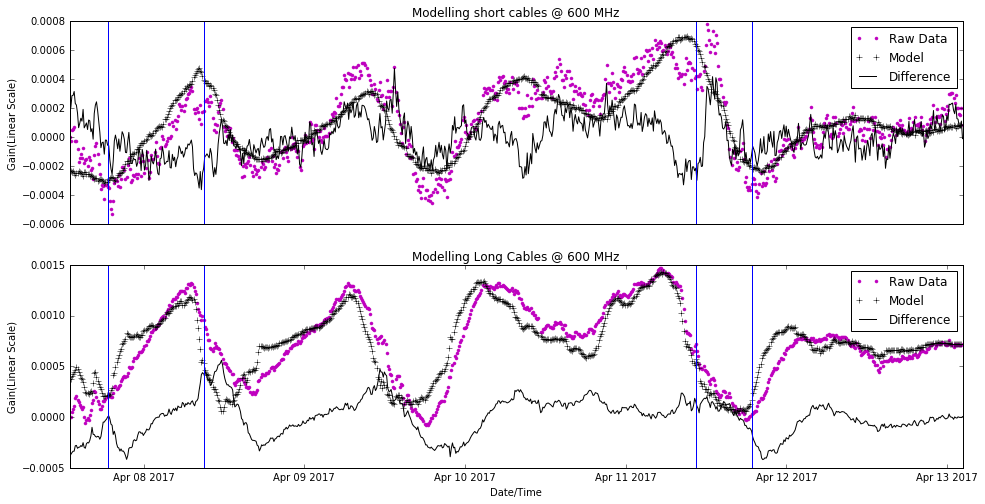

In [101]:
# Modelling short and long reflections @ 600MHz
size =800
gain_reflection_short_cable_model_600=[]
gain_reflection_long_cable_model_600=[]
short_reflection_parameters=[]
long_reflection_parameters =[]

for i in range(len(corr_list)):
    short_reflection_parameters.append([])
    long_reflection_parameters.append([])
    gain_reflection_short_cable_model_600.append([])
    gain_reflection_long_cable_model_600.append([])
        
for i in range(len(corr_list)):
    gain_reflection_short_cable_model_600[i]= np.zeros(size)
    gain_reflection_long_cable_model_600[i]= np.zeros(size)
    
    x0 = [1,1,1]
    best_vals_short, covar_short = curve_fit(func_reflection, (temp_short_cables[:]), value_all_600[i][:,freq], p0 = x0)
    best_vals_long, covar_long = curve_fit(func_reflection, temp_intercept_model[0:800]+273,value_all_long_600[i][:,freq] , p0 = x0)
    short_reflection_parameters[i] = best_vals_short
    long_reflection_parameters[i] = best_vals_long
    
    
    gain_reflection_short_cable_model_600[i][:] = func_reflection(temp_short_cables[:], short_reflection_parameters[i][0], short_reflection_parameters[i][1], short_reflection_parameters[i][2])
    gain_reflection_long_cable_model_600[i][:] = func_reflection((temp_intercept_model[0:800]+273), long_reflection_parameters[i][0], long_reflection_parameters[i][1], long_reflection_parameters[i][2])
    
    plt.figure(i+1)
    
    plt.subplot(2,1,1)
    plt.title('Modelling short cables @ 600 MHz')
    plt.ylabel('Gain(Linear Scale)')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_short_cable_model_600[i],'+k', label = 'Model')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'k', label='Difference')
    plt.legend()
    plt.xticks([])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[34])
    
    plt.subplot(2,1,2)
    plt.title('Modelling Long Cables @ 600 MHz')
    plt.ylabel('Gain(Linear Scale)')
    plt.xlabel('Date/Time')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_long_cable_model_600[i],'+k', label = 'Model')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'k', label='Difference')
    plt.legend()
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[34])

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


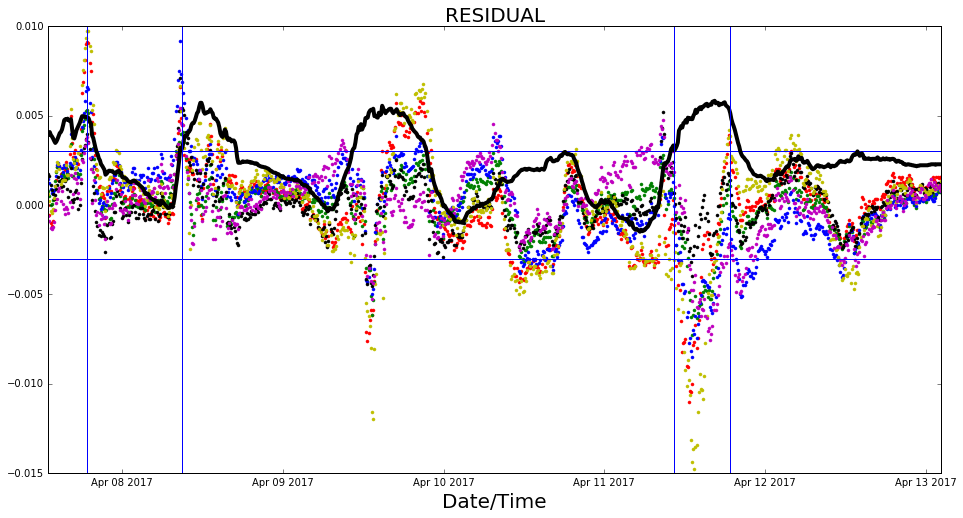

In [102]:
modelled_gain=[]
for i in range(len(corr_list)):
    modelled_gain.append([])
    
for i in range(len(corr_list)):
    modelled_gain[i] = gain_linear_model_600[i] + gain_reflection_short_cable_model_600[i] +reflections_ref_val_600[i] + reflections_ref_long_val_600[i] + gain_reflection_long_cable_model_600[i]

for i in range(len(corr_list)):
    if i!=4:
        frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
        frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
        plt.figure(1)
        plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i])
        plt.title('RESIDUAL', size=20)
        plt.xlabel('Date/Time', size=20)
        #plt.ylabel('$Gain_raw$ - $Gain_model$', size=20)
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/2000,'k',linewidth =4)
plt.axvline(x=time_intercept_model[120])
plt.axvline(x=time_intercept_model[580+30])
plt.axvline(x=time_intercept_model[580-20])
plt.axvline(x=time_intercept_model[34])


# NOTES/Questions?
# When the temperature starts incresing fast, residual is going off limit. Currently cadence is 10 min and the temperature we are getting is not exactly at same time as the acquisition, ie, acquisition at 12:17 pm and temp data is of 12:20 pm, if we do better in this, can we get better model?

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


(736428.5398148148, 736431.5471759259)

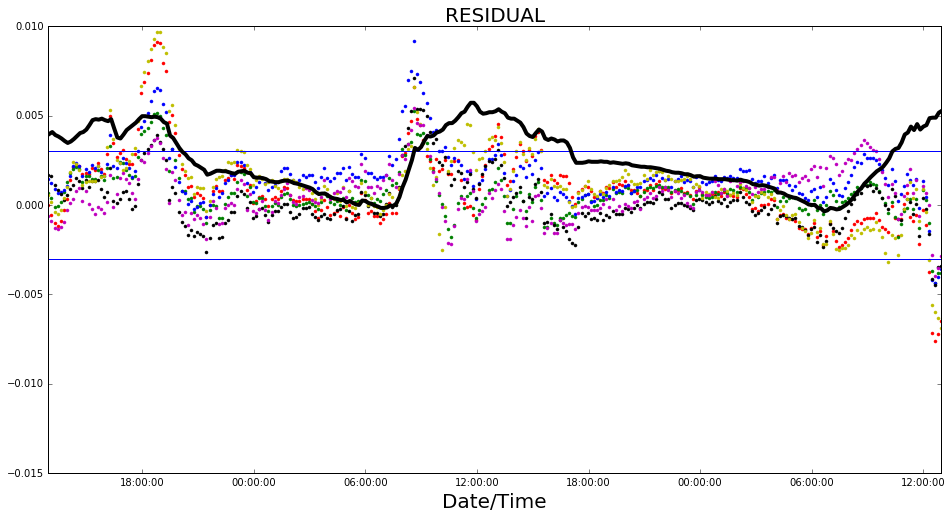

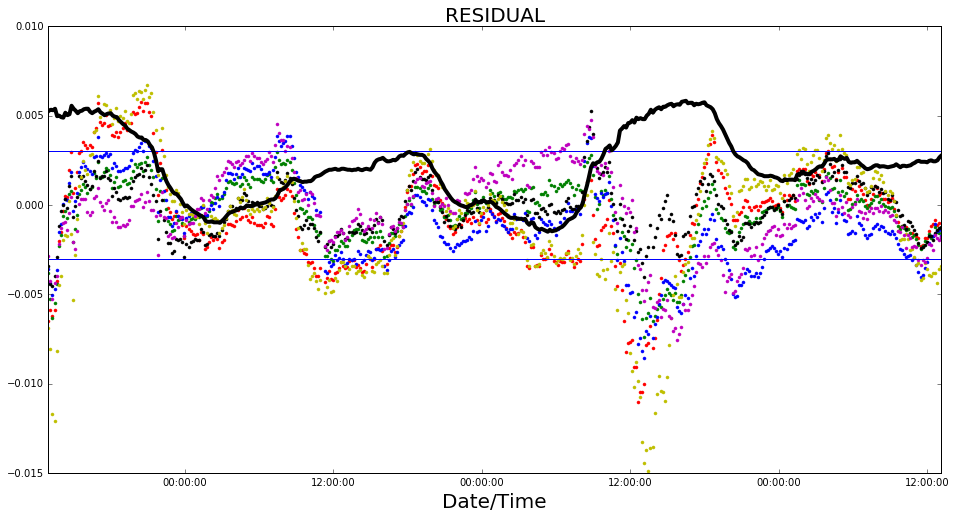

In [38]:
modelled_gain=[]
for i in range(len(corr_list)):
    modelled_gain.append([])
    
for i in range(len(corr_list)):
    modelled_gain[i] = gain_linear_model_600[i] + gain_reflection_short_cable_model_600[i] +reflections_ref_val_600[i] + reflections_ref_long_val_600[i] + gain_reflection_long_cable_model_600[i]

for i in range(len(corr_list)):
    if i!=4:
        frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
        frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
        plt.figure(1)
        plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i])
        plt.title('RESIDUAL', size=20)
        plt.xlabel('Date/Time', size=20)
        #plt.ylabel('$Gain_raw$ - $Gain_model$', size=20)
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/2000,'k',linewidth =4)
plt.xlim(date_stamp[0], date_stamp[144*2])

for i in range(len(corr_list)):
    if i!=4:
        frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
        frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
        plt.figure(2)
        plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i])
        plt.title('RESIDUAL', size=20)
        plt.xlabel('Date/Time', size=20)
        #plt.ylabel('$Gain_raw$ - $Gain_model$', size=20)
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
plt.plot(time_intercept_model[0:800],(temp_intercept_model[0:size])/2000,'k',linewidth =4)
plt.xlim(date_stamp[144*2], date_stamp[144*5])


C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


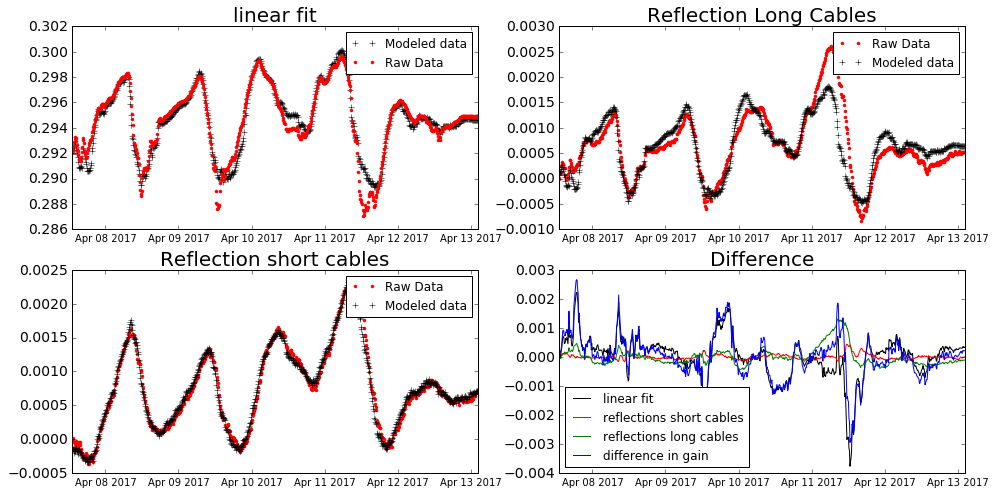

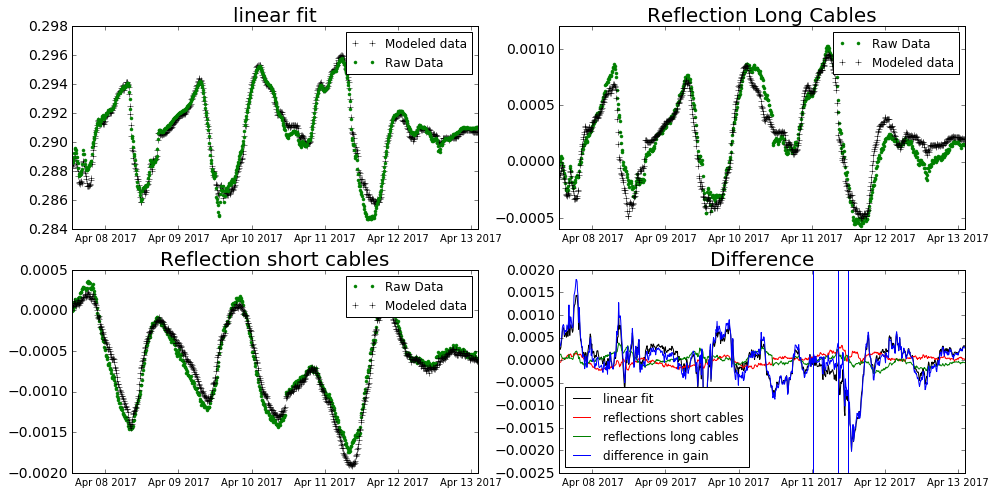

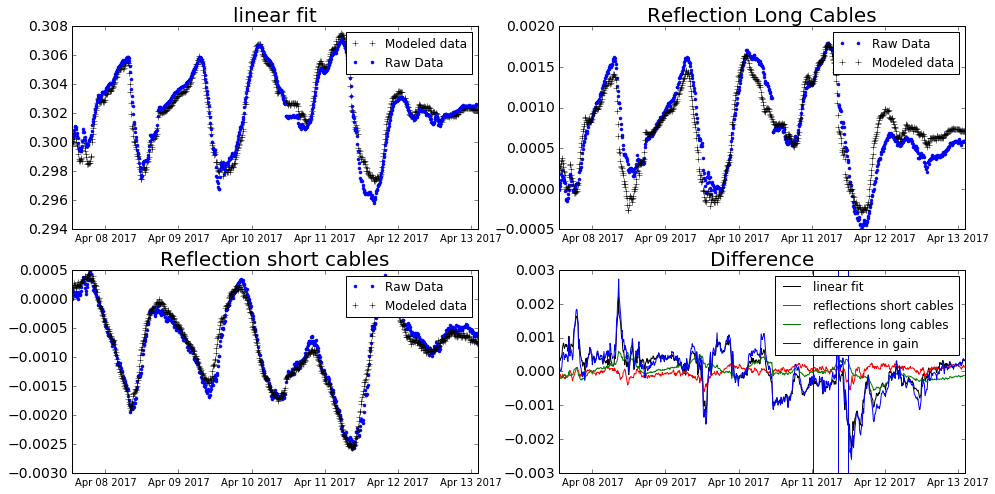

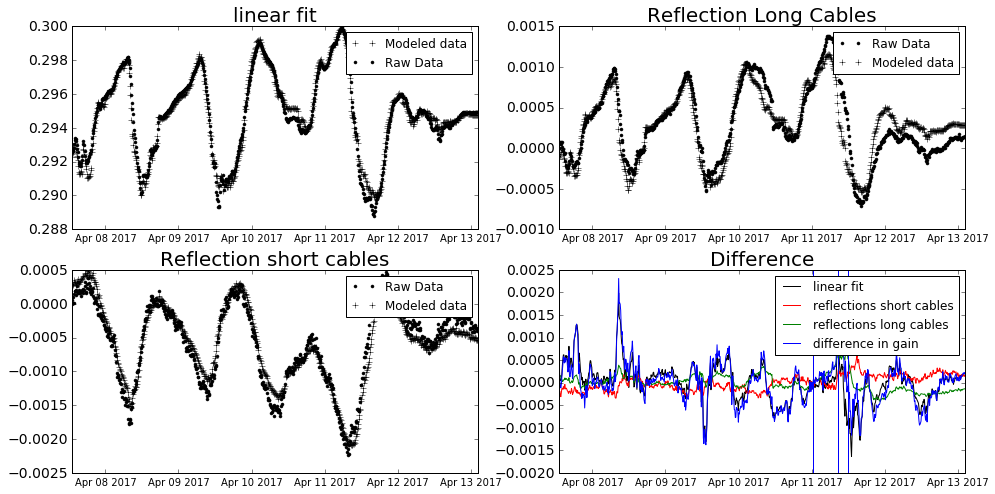

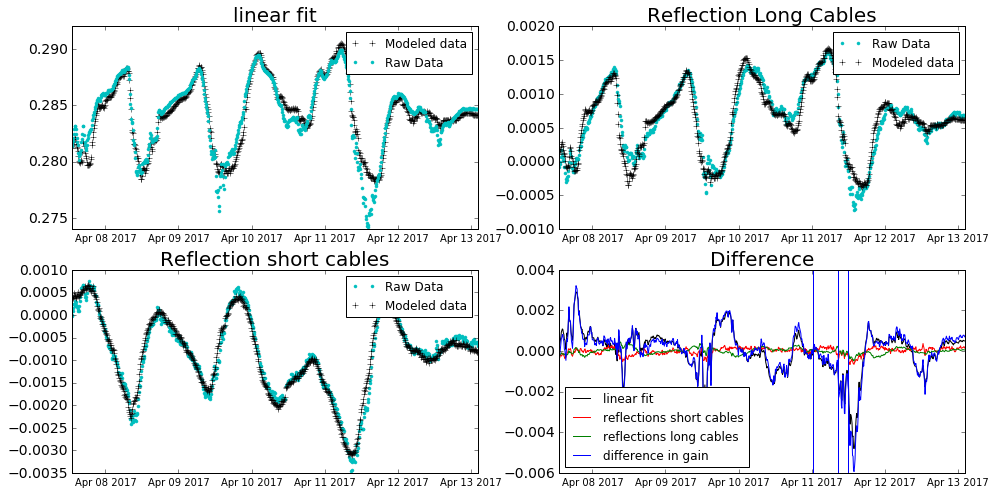

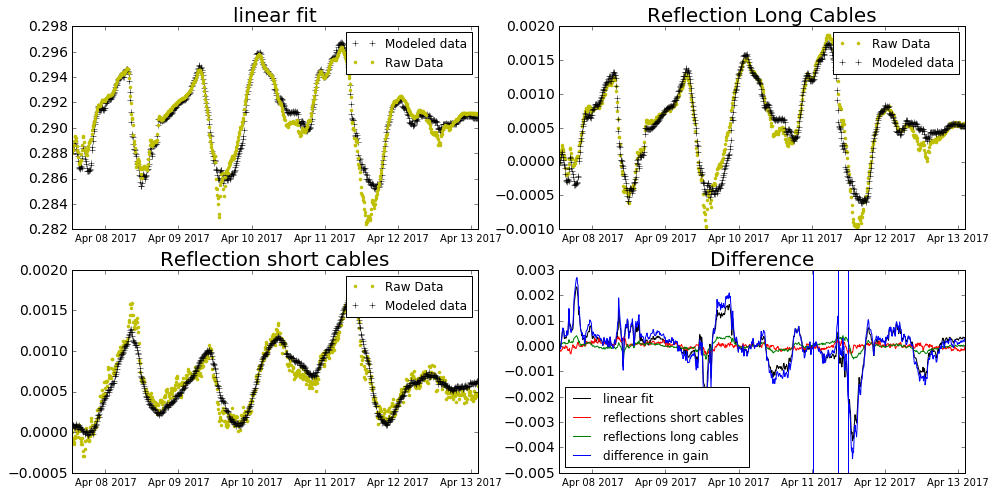

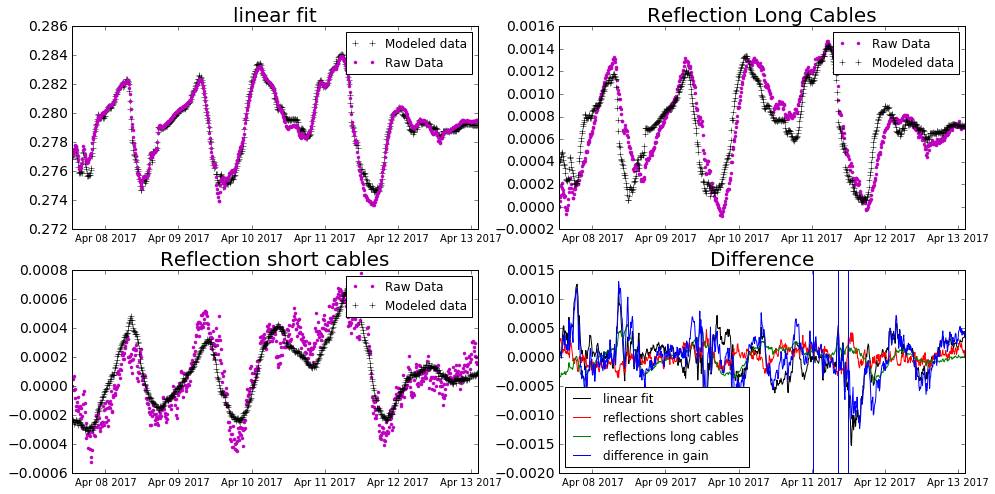

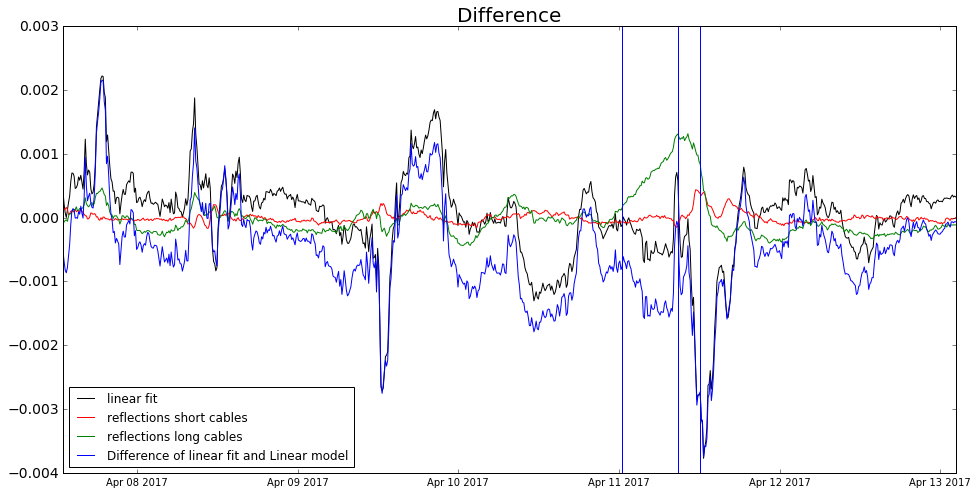

In [105]:
# based on the new model where we have proxy for temperature for short cables
for i in range(len(corr_list)):
    frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
    frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
    plt.figure(i+1)
    
    plt.subplot(2,2,1)
    plt.title("linear fit", size=20)
    plt.plot(date_stamp[0:800],gain_linear_model_600[i], '+k', label='Modeled data')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i], '.', color=colors[i], label='Raw Data')
    plt.yticks(fontsize=14)

    '''
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    '''
    plt.legend()
    
    plt.subplot(2,2,2)
    plt.title('Reflection Long Cables', size=20)
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_long_cable_model_600[i],'+k', label = 'Modeled data')
    plt.legend()
    plt.yticks(fontsize=14)

    '''
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    '''
    plt.subplot(2,2,3)
    plt.title('Reflection short cables', size=20)
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_short_cable_model_600[i],'+k', label = 'Modeled data')
    plt.legend()
    plt.yticks(fontsize=14)

    '''
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    '''
    plt.subplot(2,2,4)
    plt.title('Difference', size=20)
    #plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i] - gain_linear_model_600[i],'k', label='linear fit')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'r', label='reflections short cables')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'g', label='reflections long cables')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i]+value_all_600[i][:,freq]+value_all_long_600[i][:,freq]-(gain_linear_model_600[i]+gain_reflection_short_cable_model_600[i]+gain_reflection_long_cable_model_600[i]),'b', label='difference in gain')
    plt.legend(loc='best')
    plt.yticks(fontsize=14)

    if i==0:
        plt.figure(8)
        plt.title('Difference', size=20)
        plt.plot()
        #plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
        plt.plot(date_stamp[0:800],gain_linear_raw_600[i] - gain_linear_model_600[i],'k', label='linear fit')
        plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'r', label='reflections short cables')
        plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'g', label='reflections long cables')
        #plt.plot(date_stamp[0:800],gain_linear_raw_600[i]+value_all_600[i][:,freq]+value_all_long_600[i][:,freq]-(gain_linear_model_600[i]+gain_reflection_short_cable_model_600[i]+gain_reflection_long_cable_model_600[i]),'b', label='difference in gain')
        plt.plot(date_stamp[0:800],gain_all[0:800,i,freq] - modelled_gain[i],'b', label='Difference of linear fit and Linear model')
        plt.legend(loc='best')
        plt.yticks(fontsize=14)
        
        
    '''
    plt.subplot(3,2,5)
    plt.title('RESIDUAL', size=20)
    #plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
    plt.plot(date_stamp[0:800],(gain_linear_raw_600[i]-np.mean(gain_linear_raw_600[i]))/np.mean(gain_linear_raw_600[i]) - (gain_linear_model_600[i]-np.mean(gain_linear_model_600[i]))/np.mean(gain_linear_model_600[i]),'k', label='Difference of linear fit and Linear model')
    plt.plot(date_stamp[0:800],(value_all_600[i][:,freq]-np.mean(value_all_600[i][:,freq]))/np.mean(value_all_600[i][:,freq])  -(gain_reflection_short_cable_model_600[i]-np.mean(gain_reflection_short_cable_model_600[i]))/np.mean(gain_reflection_short_cable_model_600[i]),'r', label='Difference short cables')
    plt.plot(date_stamp[0:800],(value_all_long_600[i][:,freq]-np.mean(value_all_long_600[i][:,freq]))/np.mean(value_all_long_600[i][:,freq])  -(gain_reflection_long_cable_model_600[i]-np.mean(gain_reflection_long_cable_model_600[i]))/np.mean(gain_reflection_long_cable_model_600[i]),'g', label='Difference long cables')
    plt.plot(date_stamp[0:800],frac_change_gain_raw-frac_change_gain_model,'b', label='difference in gain')
    #plt.legend()
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)
    '''
    '''
    if i!=4:
        plt.figure(8)
        plt.title('RESIDUAL', size=20)
        plt.plot(date_stamp[0:800], (frac_change_gain_raw)- (frac_change_gain_model),'.', color=colors[i], label = 'total residual')
        plt.ylim(-0.02,0.02)
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
    '''
    plt.axvline(x=date_stamp[500])
    plt.axvline(x=date_stamp[550])
    plt.axvline(x=date_stamp[570])

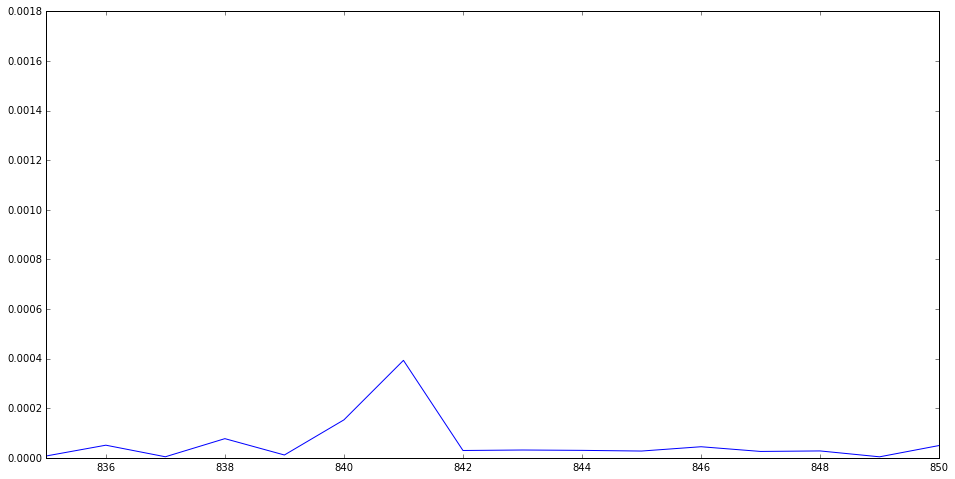

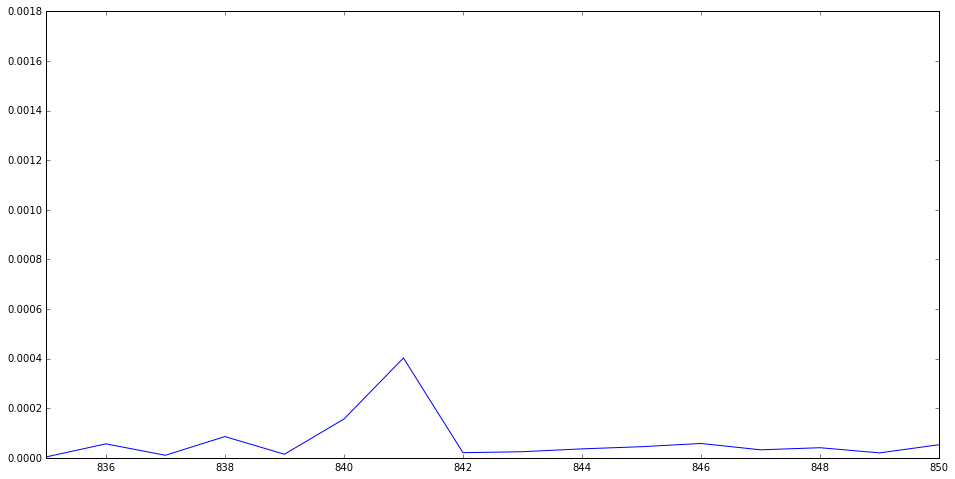

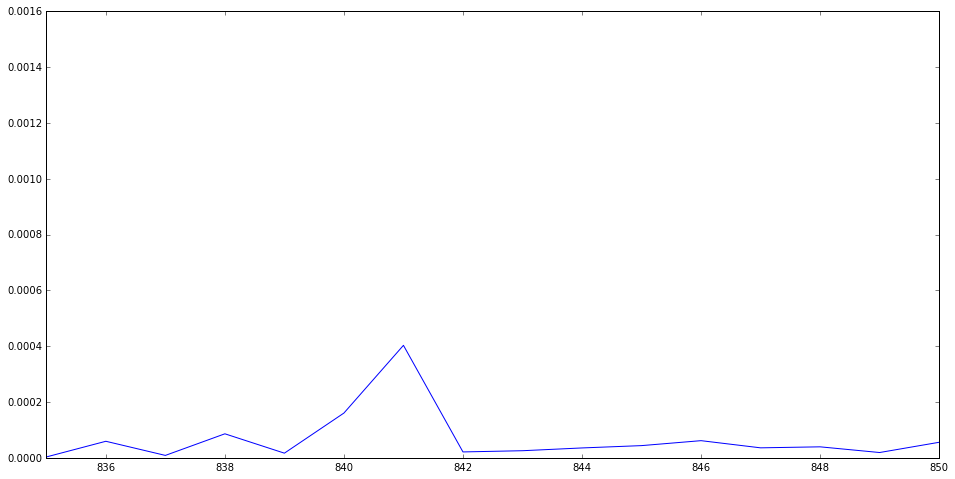

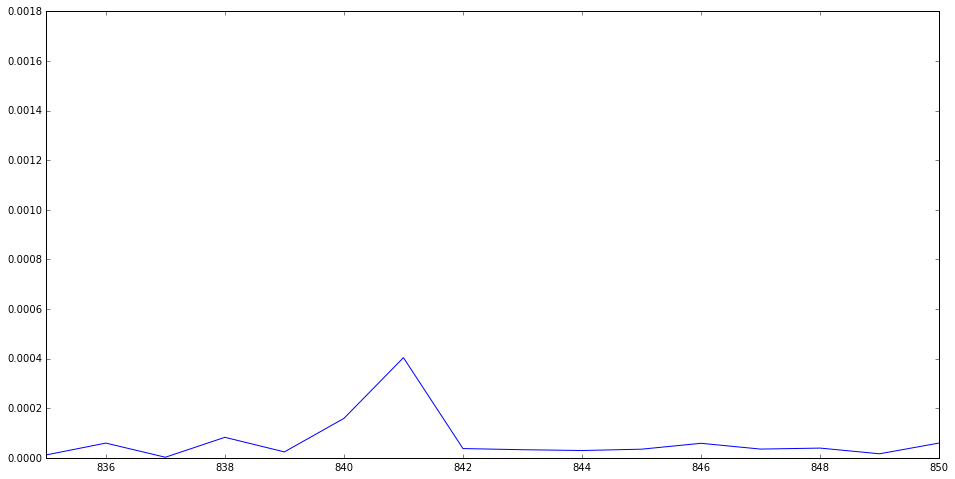

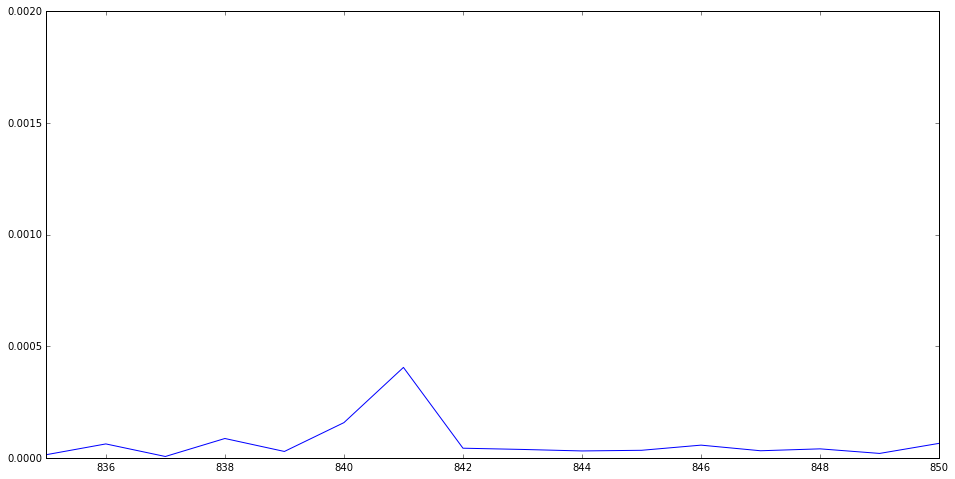

...

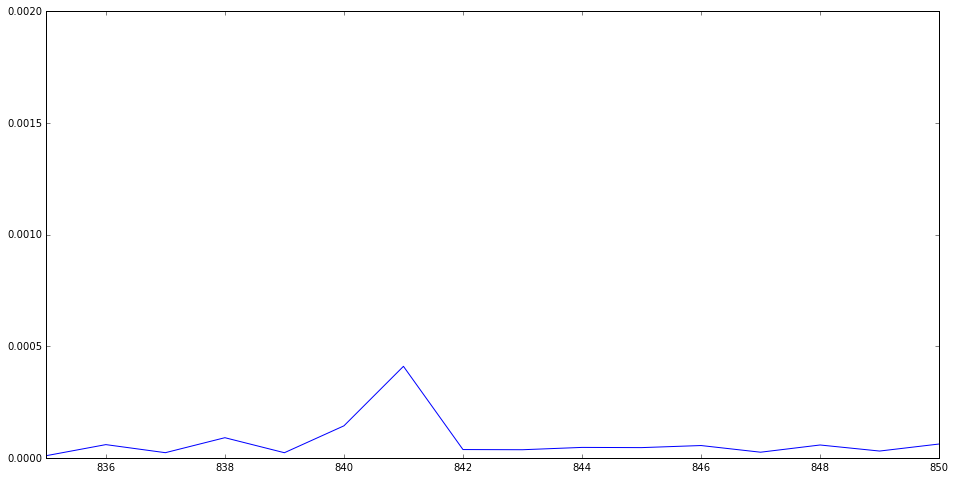

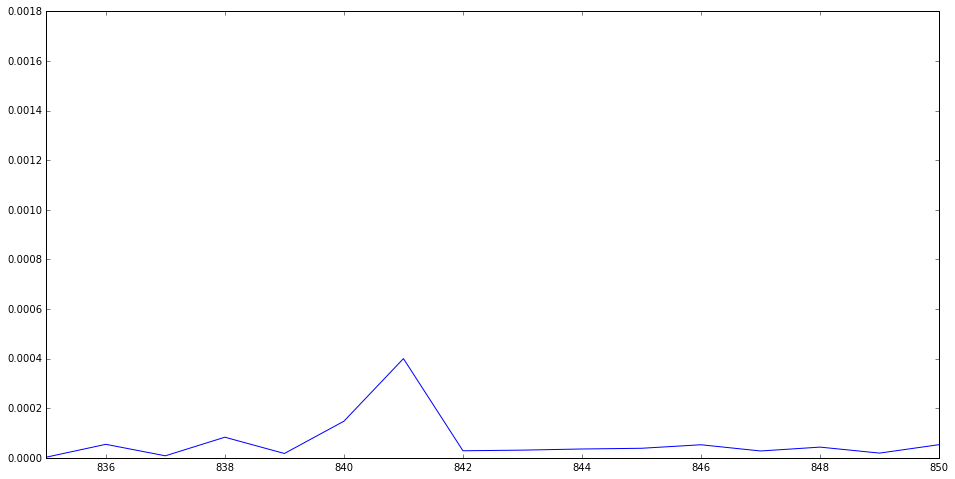

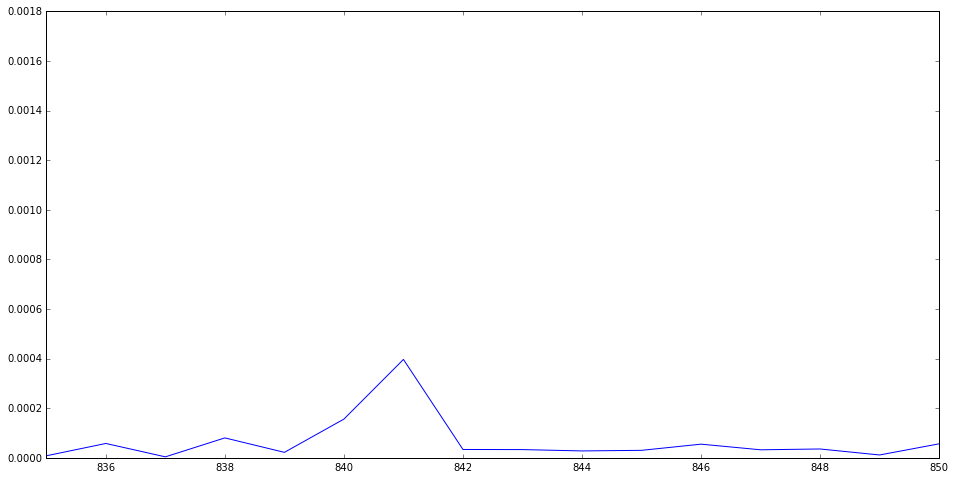

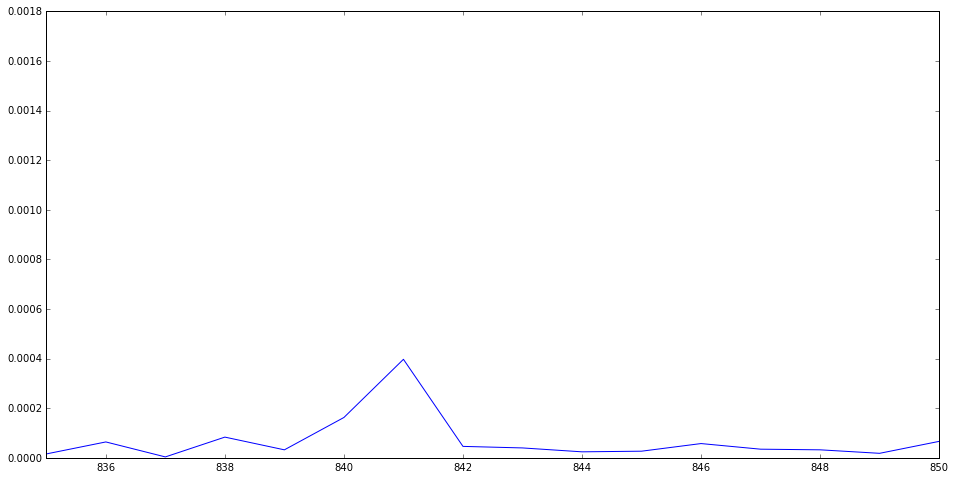

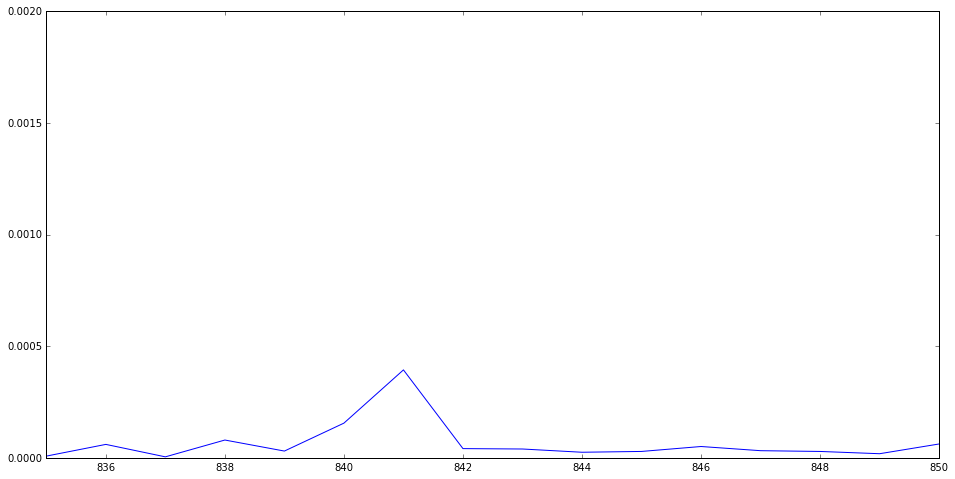

In [90]:
for i in range(20):

    z=np.polyfit(freq_phase[50:990], gain_all[i*20,0,:],1)
    p=np.poly1d(z)
    plt.figure()
    gain_line_sub = gain_all[i*20,0,:] - p(freq_phase[50:990])
    plt.plot(np.abs(np.fft.ifft(gain_line_sub )))

    plt.xlim(835,850)

C:\Users\sidhant\Anaconda3\envs\py3k\lib\site-packages\numpy\core\numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


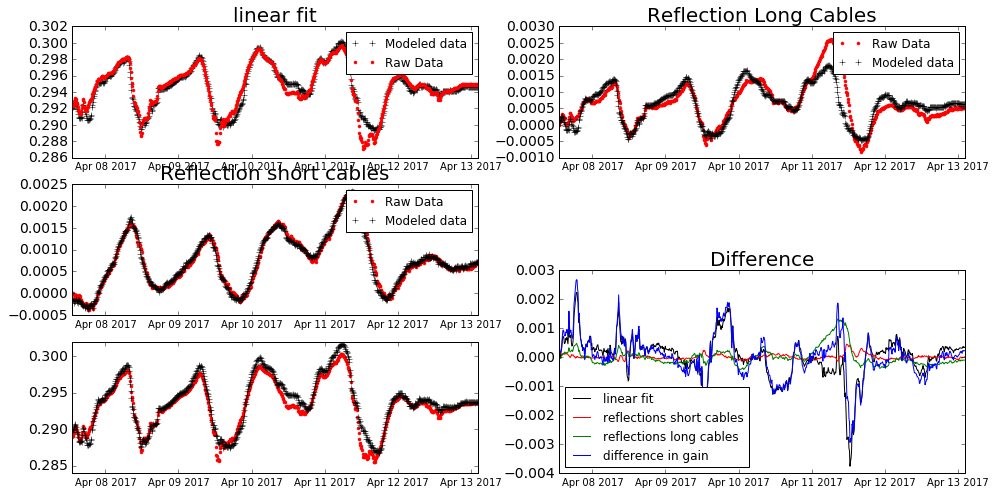

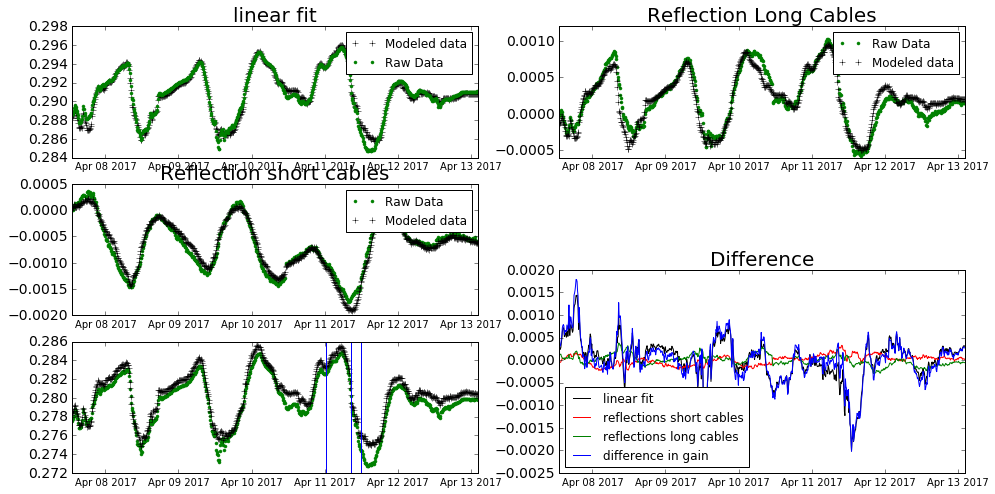

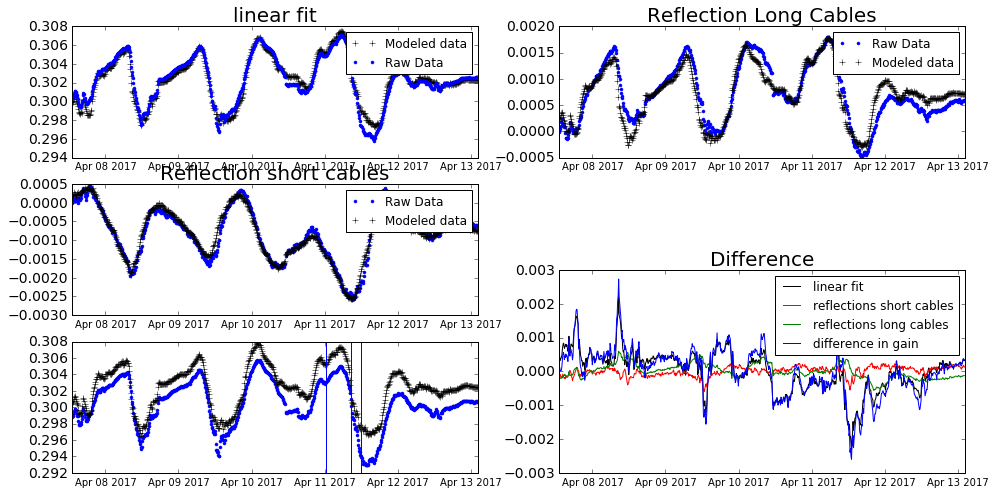

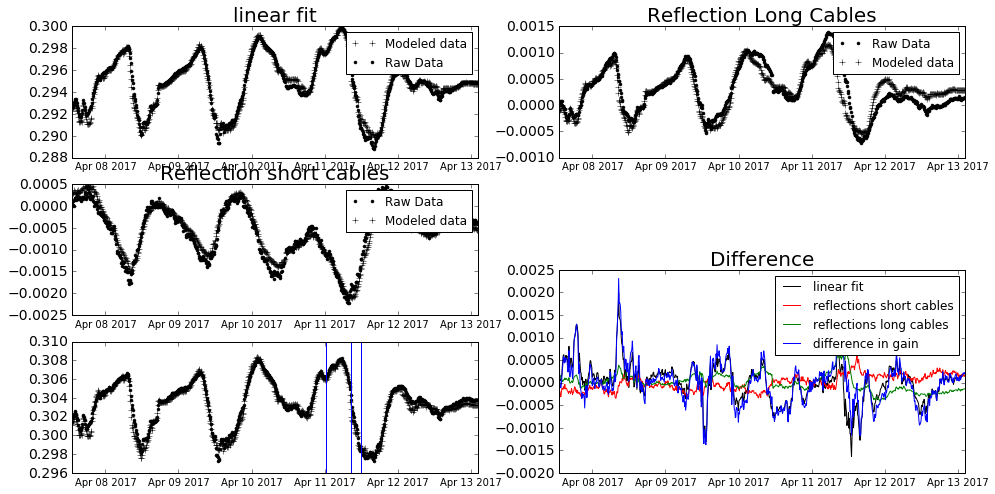

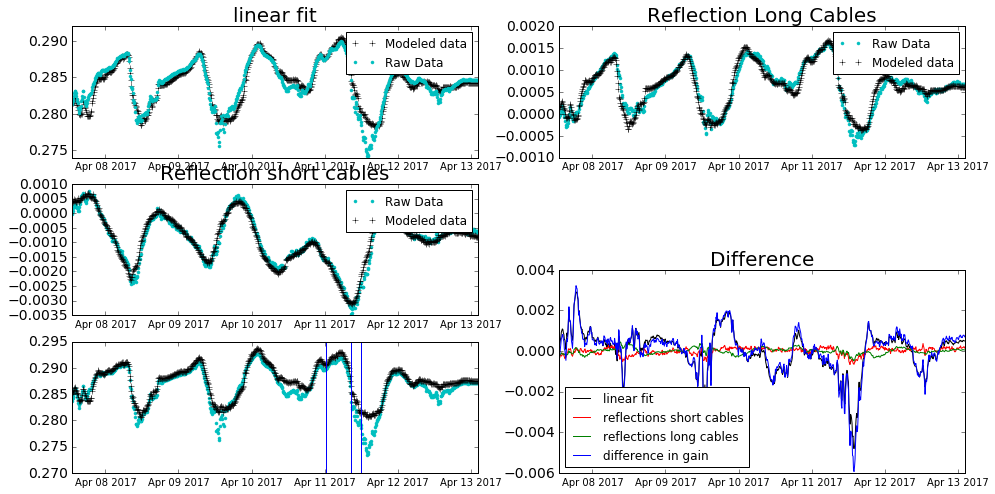

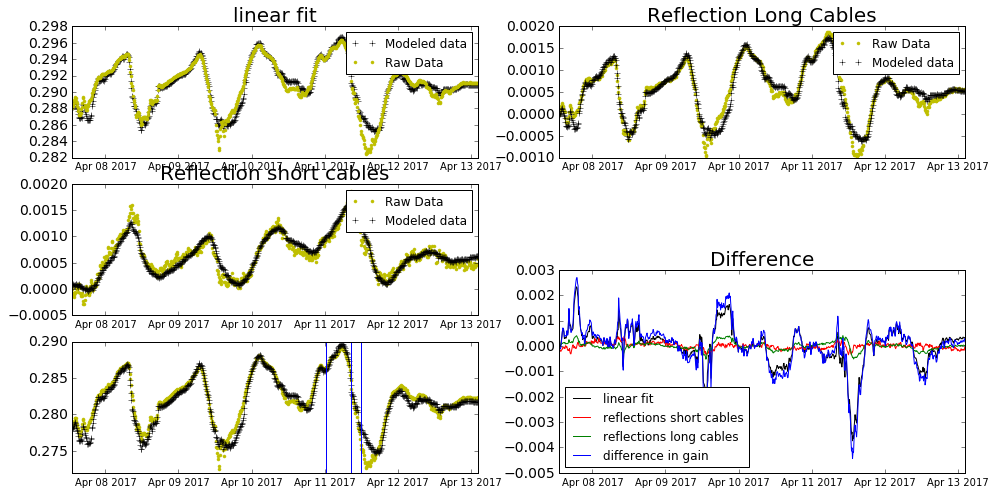

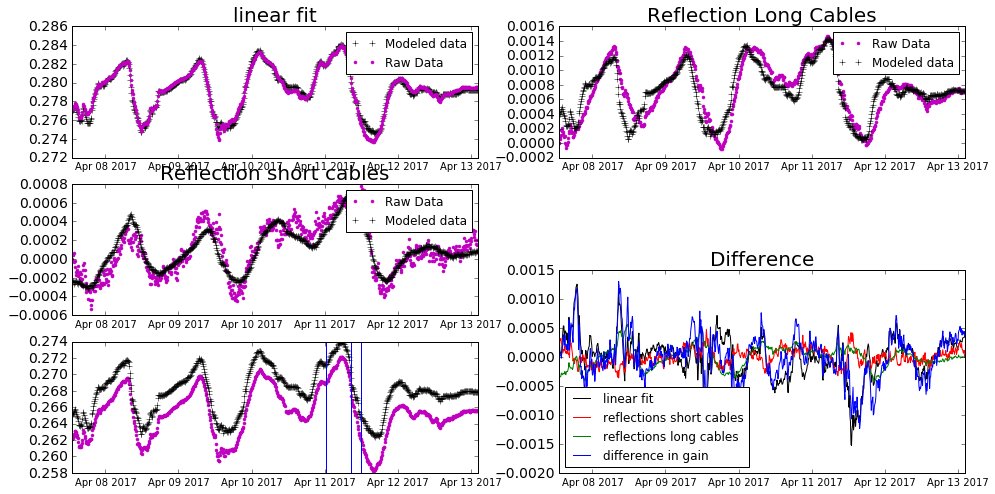

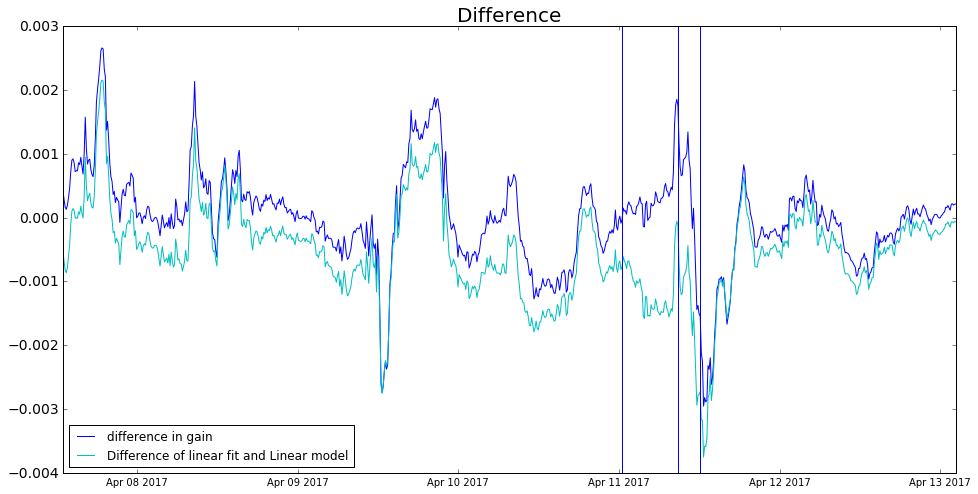

In [107]:
for i in range(len(corr_list)):
    frac_change_gain_raw = (gain_all[0:800,i,freq]-np.mean(gain_all[0:800,i,freq]))/np.mean(gain_all[0:800,i,freq])
    frac_change_gain_model = (modelled_gain[i]-np.mean(modelled_gain[i]))/np.mean(modelled_gain[i])
    plt.figure(i+1)
    
    plt.subplot(3,2,1)
    plt.title("linear fit", size=20)
    plt.plot(date_stamp[0:800],gain_linear_model_600[i], '+k', label='Modeled data')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i], '.', color=colors[i], label='Raw Data')
    plt.yticks(fontsize=14)

    '''
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    '''
    plt.legend()
    
    plt.subplot(3,2,2)
    plt.title('Reflection Long Cables', size=20)
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_long_cable_model_600[i],'+k', label = 'Modeled data')
    plt.legend()
    plt.yticks(fontsize=14)

    '''
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    '''
    plt.subplot(3,2,3)
    plt.title('Reflection short cables', size=20)
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],gain_reflection_short_cable_model_600[i],'+k', label = 'Modeled data')
    plt.legend()
    plt.yticks(fontsize=14)

    '''
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    '''
    
    plt.subplot(2,2,4)
    plt.title('Difference', size=20)
    #plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i] - gain_linear_model_600[i],'k', label='linear fit')
    plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'r', label='reflections short cables')
    plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'g', label='reflections long cables')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i]+value_all_600[i][:,freq]+value_all_long_600[i][:,freq]-(gain_linear_model_600[i]+gain_reflection_short_cable_model_600[i]+gain_reflection_long_cable_model_600[i]),'b', label='difference in gain')
    plt.legend(loc='best')
    plt.yticks(fontsize=14)
    
    plt.subplot(3,2,5)
    plt.plot(date_stamp[0:800],gain_all[0:800,i,freq],'.', color=colors[i], label = 'Raw Data')
    plt.plot(date_stamp[0:800],modelled_gain[i],'+k', label = 'Modeled data')
    plt.yticks(fontsize=14)

    

    if i==0:
        plt.figure(8)
        plt.title('Difference', size=20)
        plt.plot()
        #plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
        #plt.plot(date_stamp[0:800],gain_linear_raw_600[i] - gain_linear_model_600[i],'k', label='linear fit')
        #plt.plot(date_stamp[0:800],value_all_600[i][:,freq]-gain_reflection_short_cable_model_600[i],'r', label='reflections short cables')
        #plt.plot(date_stamp[0:800],value_all_long_600[i][:,freq]-gain_reflection_long_cable_model_600[i],'g', label='reflections long cables')
        plt.plot(date_stamp[0:800],gain_linear_raw_600[i]+value_all_600[i][:,freq]+value_all_long_600[i][:,freq]-(gain_linear_model_600[i]+gain_reflection_short_cable_model_600[i]+gain_reflection_long_cable_model_600[i]),'b', label='difference in gain')
        plt.plot(date_stamp[0:800],gain_all[0:800,i,freq] - modelled_gain[i],'c', label='Difference of linear fit and Linear model')
        plt.legend(loc='best')
        plt.yticks(fontsize=14)
        
        
    '''
    plt.subplot(3,2,5)
    plt.title('RESIDUAL', size=20)
    #plt.plot(date_stamp[0:800], frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i], label = 'total residual')
    plt.plot(date_stamp[0:800],(gain_linear_raw_600[i]-np.mean(gain_linear_raw_600[i]))/np.mean(gain_linear_raw_600[i]) - (gain_linear_model_600[i]-np.mean(gain_linear_model_600[i]))/np.mean(gain_linear_model_600[i]),'k', label='Difference of linear fit and Linear model')
    plt.plot(date_stamp[0:800],(value_all_600[i][:,freq]-np.mean(value_all_600[i][:,freq]))/np.mean(value_all_600[i][:,freq])  -(gain_reflection_short_cable_model_600[i]-np.mean(gain_reflection_short_cable_model_600[i]))/np.mean(gain_reflection_short_cable_model_600[i]),'r', label='Difference short cables')
    plt.plot(date_stamp[0:800],(value_all_long_600[i][:,freq]-np.mean(value_all_long_600[i][:,freq]))/np.mean(value_all_long_600[i][:,freq])  -(gain_reflection_long_cable_model_600[i]-np.mean(gain_reflection_long_cable_model_600[i]))/np.mean(gain_reflection_long_cable_model_600[i]),'g', label='Difference long cables')
    plt.plot(date_stamp[0:800],frac_change_gain_raw-frac_change_gain_model,'b', label='difference in gain')
    #plt.legend()
    plt.axhline(y=-0.003)
    plt.axhline(y=0.003)
    '''
    '''
    if i!=4:
        plt.figure(8)
        plt.title('RESIDUAL', size=20)
        plt.plot(date_stamp[0:800], (frac_change_gain_raw)- (frac_change_gain_model),'.', color=colors[i], label = 'total residual')
        plt.ylim(-0.02,0.02)
        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
    '''
    plt.axvline(x=date_stamp[500])
    plt.axvline(x=date_stamp[550])
    plt.axvline(x=date_stamp[570])

In [ ]:
for k in range(len(corr_list)):
    plt.figure(1)
    plt.plot(gain_all[500:650,k,freq])
    plt.axvline(x=80-20)
    plt.axvline(x=80+30)

In [ ]:
for i in range(len(corr_list)):
    plt.figure(i+1)
    plt.title("linear model")
    plt.plot(date_stamp[0:800],gain_linear_model_600[i], '.', color=colors[i], label='Modelled')
    plt.plot(date_stamp[0:800],gain_linear_raw_600[i], '+k', label='Raw Gain Linear part')

    plt.axvline(x=time_intercept_model[120])
    plt.axvline(x=time_intercept_model[34])
    plt.axvline(x=time_intercept_model[580+30])
    plt.axvline(x=time_intercept_model[580-20])
    plt.xlim(time_intercept_model[580-30],time_intercept_model[580+40])
    plt.legend()

In [ ]:
modelled_gain=[]
sun_time=[12,13,14,15]

for i in range(len(corr_list)):
    modelled_gain.append([])
    
for i in range(len(corr_list)):
    modelled_gain[i] = gain_linear_model_600[i] + gain_reflection_short_cable_model_600[i] + gain_reflection_long_cable_model_600[i]

for i in range(len(corr_list)):
    raw_non_sun_gain=[]
    modelled_non_sun_gain=[]
    date_stamp_non_sun=[]
    
    if i!=4:
        for k in range(size):
            if time_intercept_model[k].hour not in sun_time:
                raw_non_sun_gain.append(gain_all[k,i,freq])
                modelled_non_sun_gain.append(modelled_gain[i][k])
                date_stamp_non_sun.append(date_stamp)
        frac_change_gain_raw = (raw_non_sun_gain-np.mean(raw_non_sun_gain))/np.mean(raw_non_sun_gain)
        frac_change_gain_model = (modelled_non_sun_gain-np.mean(modelled_non_sun_gain))/np.mean(modelled_non_sun_gain)
        #print(frac_change_gain_raw)
        plt.figure(1)
        plt.plot(frac_change_gain_raw-frac_change_gain_model,'.', color=colors[i])

        plt.axhline(y=-0.003)
        plt.axhline(y=0.003)
    

